# Notebook Goal
- check for constant or changing or collapsed periodicities in each source
- look for correlations between super-orbital properties and period change
# Tasks to Consider
- ~~add periodicity search within ~5 days of best period and add to table~~
    - width parameter allows a change in the search
    - all periodograms now shown in a plot, though difficult since such a small search
- ~~automatic check of correlations~~
    - still need to manually look but plots any variables with correlation >0.7
- try out folding without detrending

In [20]:
from uncertainties import ufloat
from uncertainties.umath import *
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.stats import LombScargle
from scipy import signal
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import scipy.optimize
import glob
from astropy.table import Table,join,vstack,unique
from importlib import reload
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sb
import scipy.stats as st
import wotan

import ogle as o #module

blue = 'cornflowerblue'
navy = 'navy'
purple = 'rebeccapurple'
pink = '#CF6275'
maroon = 'maroon'

cross = Table.read('sourcefiles.csv')
full = Table.read('smc_x_m03_zar_match_OGLE_v2.ascii',format='ascii')

summ = pd.read_csv('summtab.csv')
alls = pd.read_csv('allsummtab.csv') #most updated table

cross['Part'] = 1
cross2 = Table.read('part2files.csv')
cross2 = join(cross2,full,keys='src_n')
cross2['Part'] = 2

mlist2 = ['OII I','OIII I','OIV I']
mlist1 = ['OII I','OIII I']

srcns = np.array(alls['src_n'])
#saving figure function
def sf(name,dpi=150):
    plt.savefig(f'Figs/{name}.png',bbox_inches='tight',dpi=dpi)
#simple plotting function
def plot(s,calib=False,both=True):
    try:band = o.getIV(s,cross,both=both,stack=True,plot=True,mlist=mlist1,figsize=(4,3),calib=calib)
    except:band = o.getIV(s,cross2,both=both,stack=True,plot=True,mlist=mlist2,figsize=(4,3),calib=calib)

In [137]:
def orbchunks(src,bp,num=365,time=True,minp=200,pbins=16,det=True,findpd=False,plotlc=True,times=[],mags=[],detr=[],trend=[],save=False,file='',getstd=False,search=True,width=5):
    '''Make table of phase-folded properties after dividing LC into chunks
    search: bool to search each chunk within five days of best period
    width: default periodogram width; 15 added if period above 100'''
    #if chunks not passed in, use cut function
    if len(times)<1: times,mags,detr,trend = o.cut(src,cross,cross2,mlist1,mlist2,time=time,minp=minp,cut=num,glob=True,plot=False,retsplit=True)
    fig = plt.figure(figsize=(22,4*int(num/5)))
    c = 1
    if findpd:
        #get period from allsumm table
        row = alls[alls['src_n']==src]
        #if there's a manually-filled best period, use that
        if float(row['best period'])>0: bp = float(row['best period'])
        #otherwise use best period from auto analysis
        else:bp = float(row['best auto det pd'])
        #print est period
        estp = float(row['est. period'])
        print(f'established period: {estp}')
    means = [] #calculate means of segments without detrending to get brightness
    if getstd: 
        #array to save all phase bin info
        avg_arr = np.zeros((num,pbins*2))
    #save freq and power info to put all on one plot
    freqs,powers = [],[]
    ibs = [] #list of iband tables
    for i in range(len(times)):
        ax = fig.add_subplot(1*int(num/5),5,c)
        #make segment into astropy table
        ib = Table({'MJD-50000':times[i],'I mag':mags[i],'I detrend':detr[i]})   
        ibs.append(ib)#add table to list to be used in full periodogram
        #construct dictionary (could be made more efficient since step calculated twice)
        pdict = o.combine(src,cross,full,iband=ib,det=det,pd=bp,pbins=pbins,close=True,testbins=False)
        #get values for step function
        mid,avg,err = o.meanphase(ib,bp,pbins=pbins,det=det,double=True,sterr=True,stdev=True,divide=True)
        #save phase bin averages to array
        if getstd: avg_arr[i,:] = avg
        ax.step(mid,avg,where='mid',color='black',label=f'{bp:.2f}d')
        if c==1: ax.legend()
        plt.errorbar(mid,avg,yerr=err,color='grey',alpha=0.5)
        maxi,mini = np.nanmax(avg)+np.nanmax(err),np.nanmin(avg)-np.nanmax(err)
        ax.set_ylim(maxi,mini)
        #calculate mean I mag and add to list
        meanmag = np.mean(mags[i])
        means.append(meanmag)
        #search each for a better period
        if search:
            if bp>width: mp = bp-width
            else: mp = 1.1
            if bp>100:
                mp = bp-width-15
                mxp = bp+width+15
            else: 
                mxp = bp+width
            freq,power,nbp = o.periodogram(ib,det=det,minp=mp,maxp=mxp,more=True,plot=False)
            freqs.append(freq);powers.append(power)
            maxpow = np.max(power)
        #turn first dictionary into main table
        if c==1:
            main = pd.DataFrame(pdict,index=[0])
            main['start time'] = times[i][0]
            if search: 
                main['best period'] = nbp
                main['max power'] = maxpow
            if det: ax.set_ylabel('Detrended I mag')
            else: ax.set_ylabel('I mag')
            ax.set_xlabel('Phase')
        #otherwise make table and stack it with main
        else: 
            temp = pd.DataFrame(pdict,index=[c-1])
            temp['start time'] = times[i][0]
            if search: 
                temp['best period'] = nbp
                temp['max power'] = maxpow
            #add new row to table by concatenation
            main = pd.concat([main,temp])
        c+=1
    #take standard deviation for each phase bin
    if getstd: pstds = np.std(avg_arr,axis=0)
    if save: plt.savefig(file+'.png',dpi=150,bbox_inches='tight')
    #add I mag means to table
    main['mean I'] = means
    #plot LC and periodograms with different colors for different segments
    if plotlc:
        fig,[ax1,ax2] = plt.subplots(1,2,figsize=(16,4))
        maxi,mini = 0,np.inf
        for i in range(len(times)):
            ax1.scatter(times[i],mags[i],s=4)
            ax2.plot(1/freqs[i],powers[i])
            if np.max(mags[i])>maxi:maxi = np.max(mags[i])
            if np.min(mags[i])<mini:mini = np.min(mags[i])
            #plot trend
            ax1.plot(times[i],trend[i],color='grey')
        ax1.set_ylim(maxi+.04,mini-.04)
        ax1.set_ylabel('I mag',fontsize=13)
        ax1.set_xlabel('MJD-50000',fontsize=13)
        #overall periodogram in black
        iband = vstack(ibs)
        o.splinedetrend(iband)
        freq,power,nbp = o.periodogram(iband,det=det,minp=mp,maxp=mxp,more=True,plot=False)
        ax2.plot(1/freq,power,color='black')
    if getstd: return main,pstds
    else: return main

In [3]:
def plotcorr(tab,minc=0.7):
    cor = tab.corr()
    #list of xcor and ycor
    clist = []
    for i in range(len(cor.index)):
        for j in range(len(cor.columns)):
            if cor.iloc[i,j]>minc and i!=j and (j,i) not in clist: 
                plt.figure(figsize=(4,3))
                x = tab[cor.columns[j]]
                y = tab[cor.index[i]]
                plt.scatter(x,y,color='black')
                plt.xlabel(cor.columns[j],fontsize=13)
                plt.ylabel(cor.index[i],fontsize=13)
                minx,maxx = np.min(x),np.max(x)
                xrange = maxx-minx
                plt.xlim(minx-xrange/10,maxx+xrange/10)
                miny,maxy = np.min(y),np.max(y)
                yrange = maxy-miny
                plt.ylim(miny-yrange/10,maxy+yrange/10)
                clist.append((i,j))

9 chunks use min points rather than time


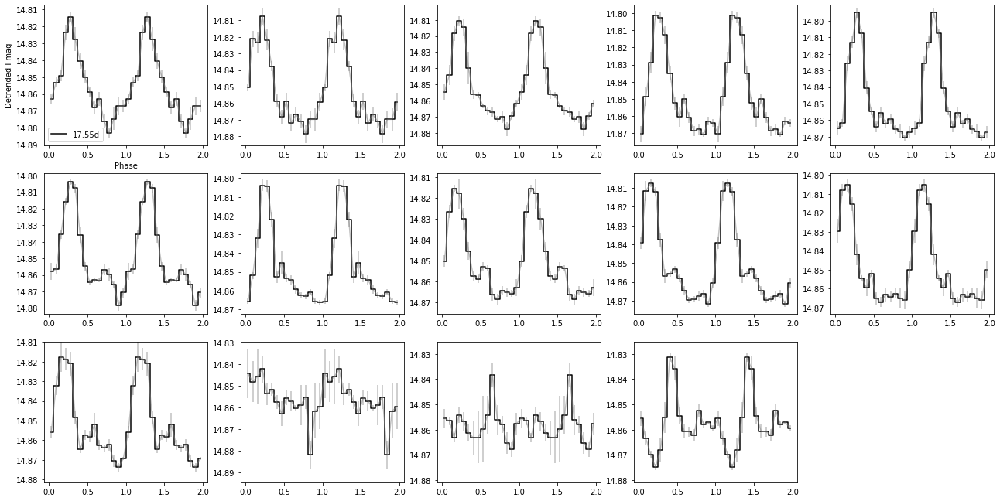

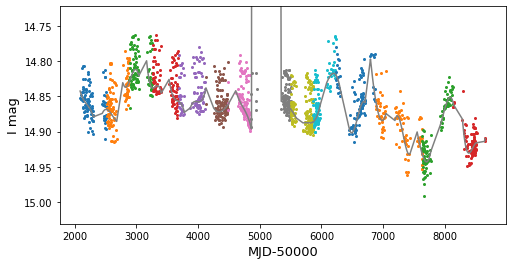

In [127]:
#example
tab = orbchunks(96,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,times=[],mags=[],detr=[],trend=[],save=False,file='',getstd=False)

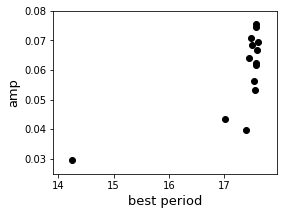

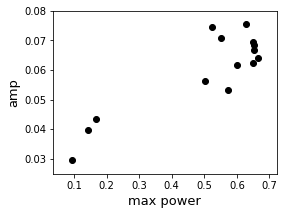

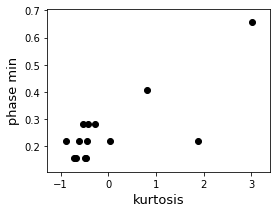

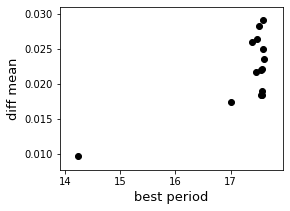

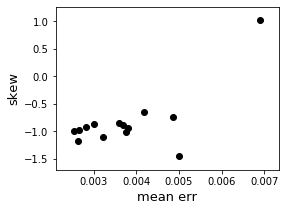

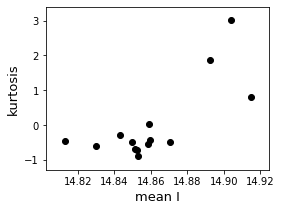

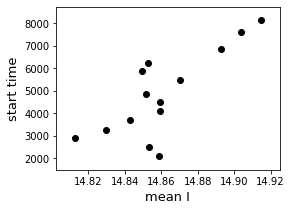

In [128]:
plotcorr(tab,minc=.7) #amp and max power correlated

9 chunks use min points rather than time


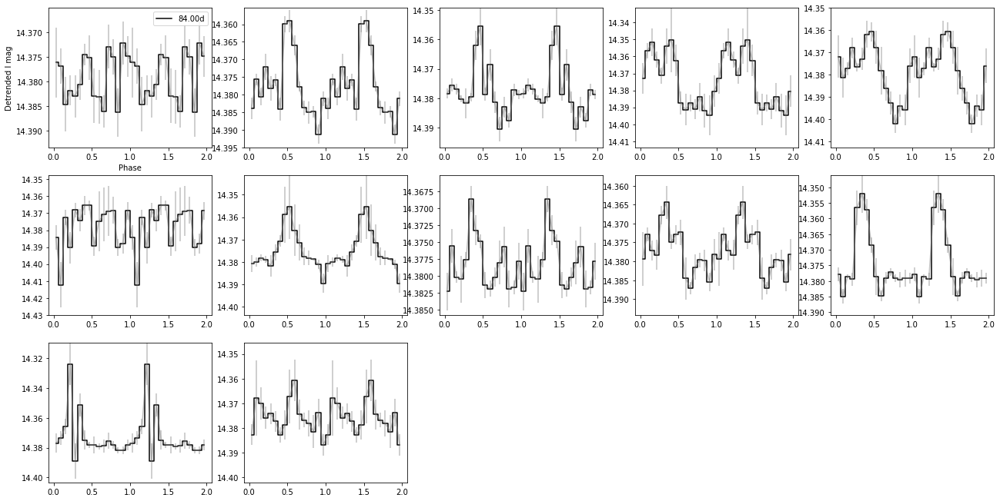

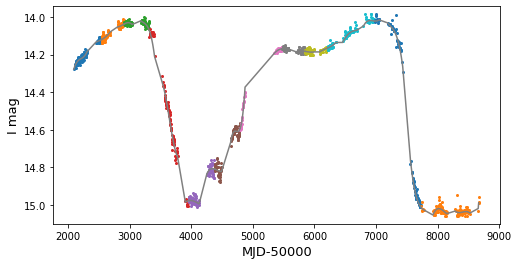

In [129]:
tab = orbchunks(2,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

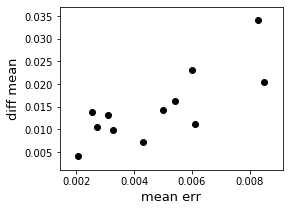

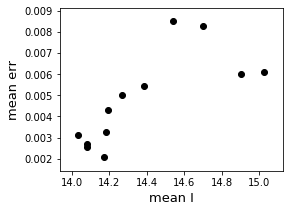

In [130]:
plotcorr(tab,minc=.7)

9 chunks use min points rather than time


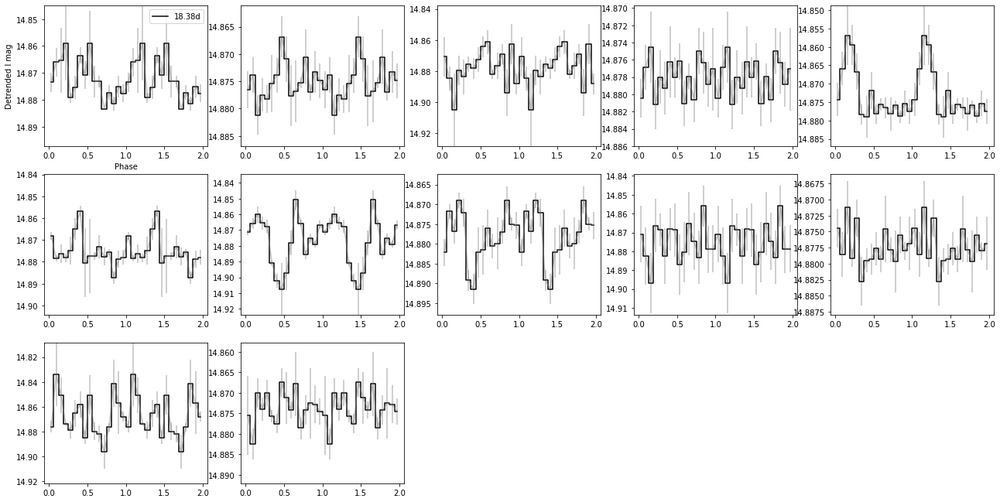

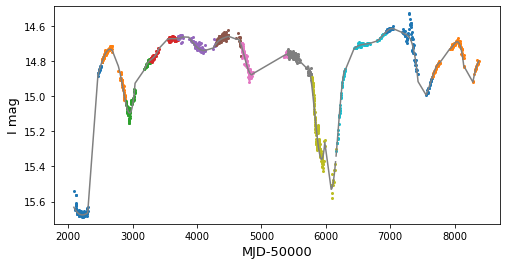

In [133]:
tab = orbchunks(3,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

In [134]:
tab['best period']

0     15.519293
1     22.251805
2     23.380000
3     16.573656
4     18.580121
5     18.976573
6     17.851078
7     18.363741
8     21.498075
9     17.594366
10    19.414011
11    20.457260
Name: best period, dtype: float64

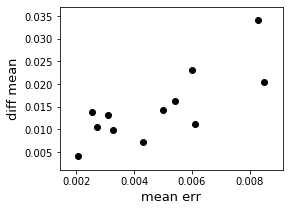

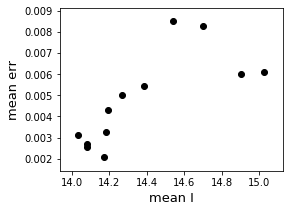

In [131]:
plotcorr(tab,minc=.7)

9 chunks use min points rather than time


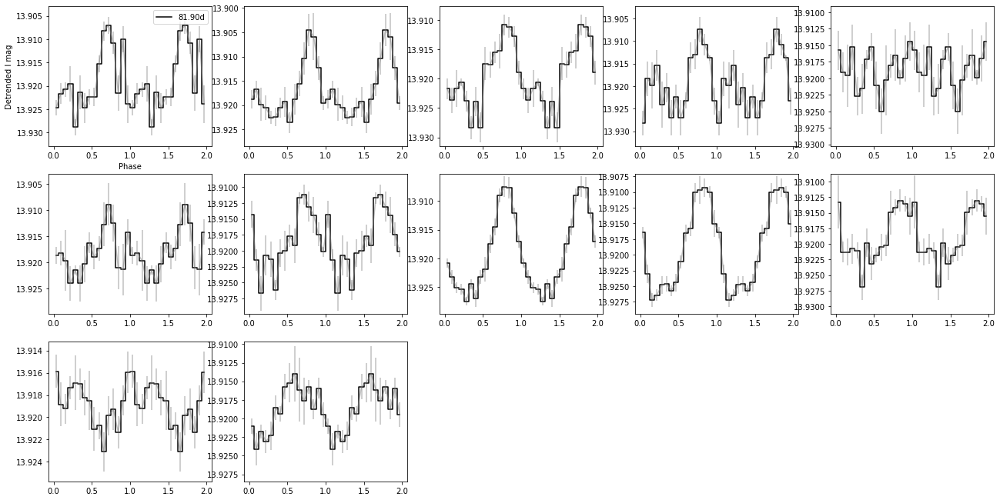

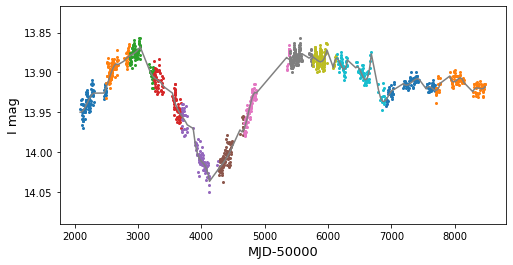

In [135]:
tab = orbchunks(4,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

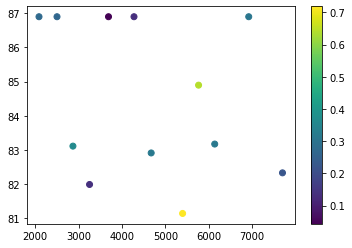

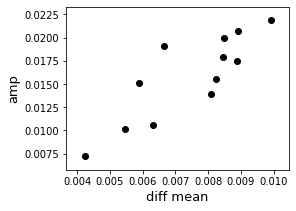

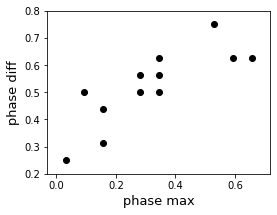

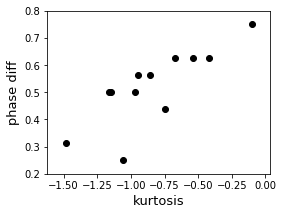

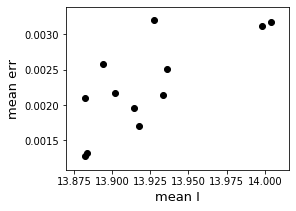

In [138]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

9 chunks use min points rather than time


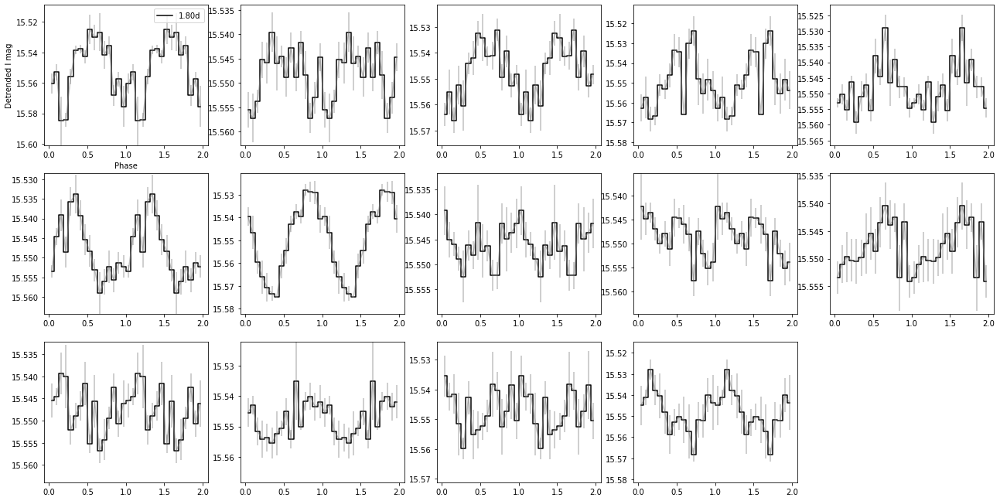

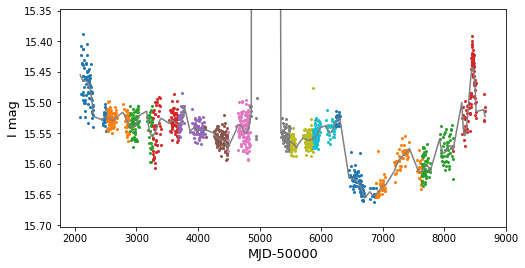

In [142]:
tab = orbchunks(5,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

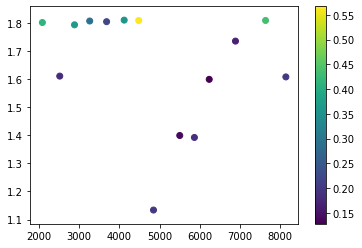

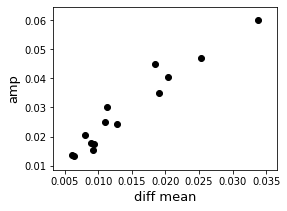

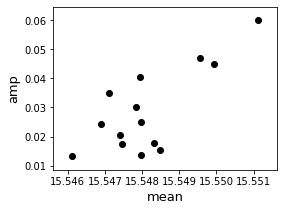

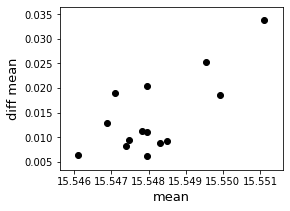

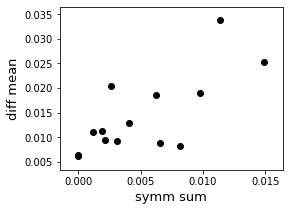

In [143]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

12 chunks use min points rather than time


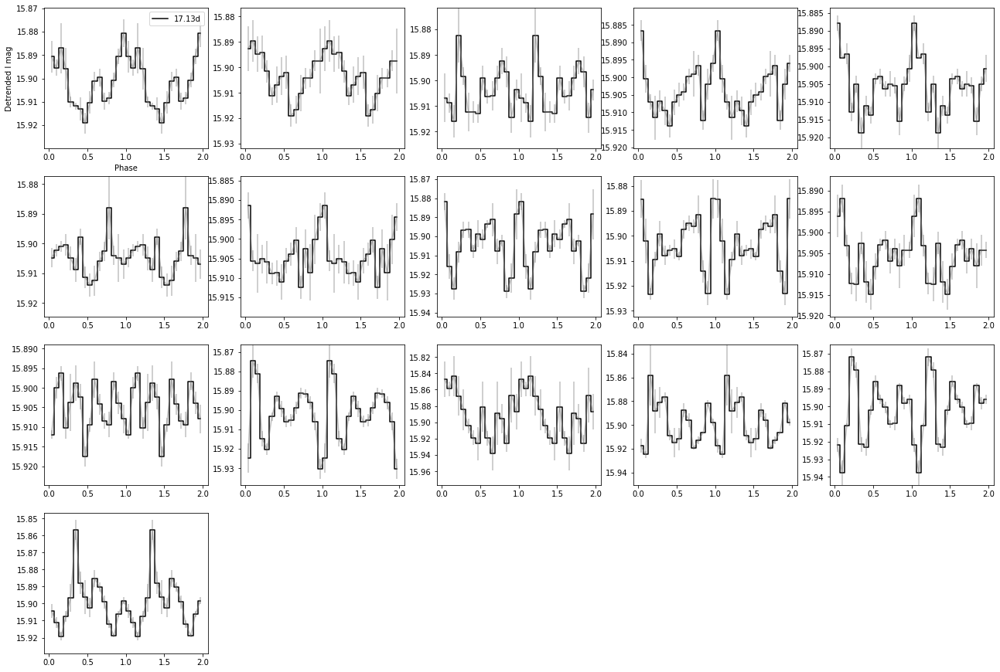

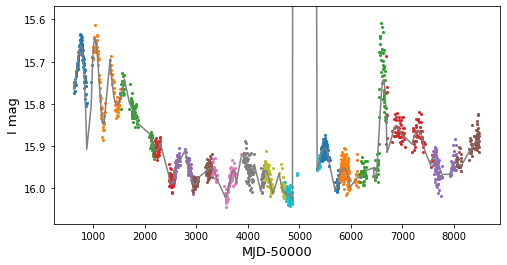

In [144]:
tab = orbchunks(6,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

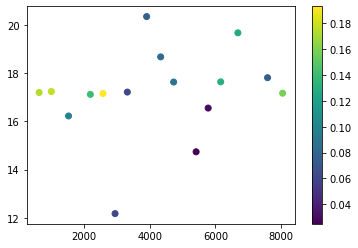

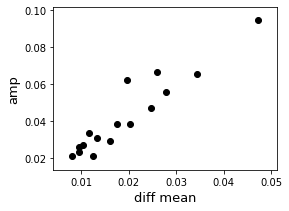

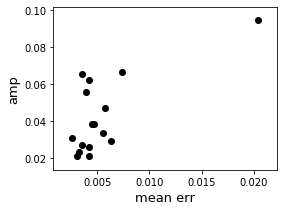

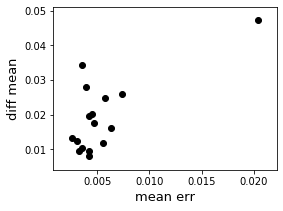

In [145]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

9 chunks use min points rather than time


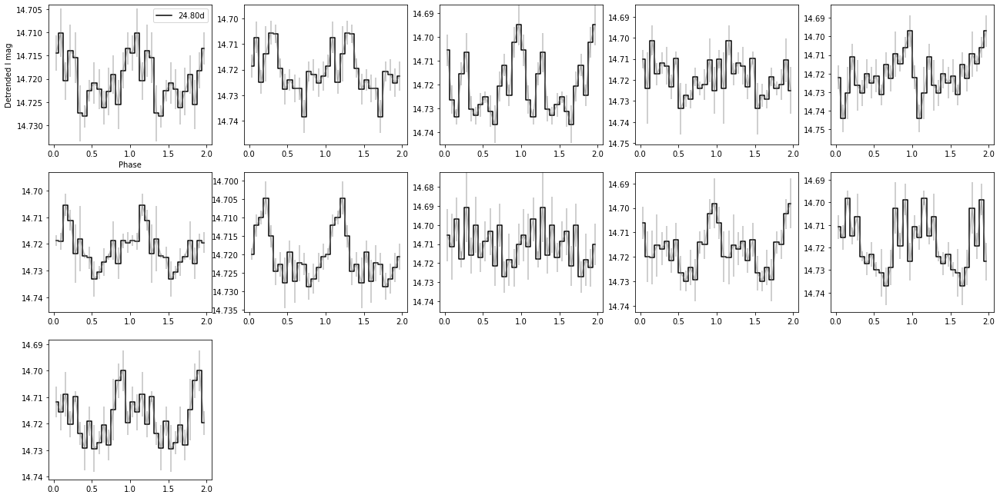

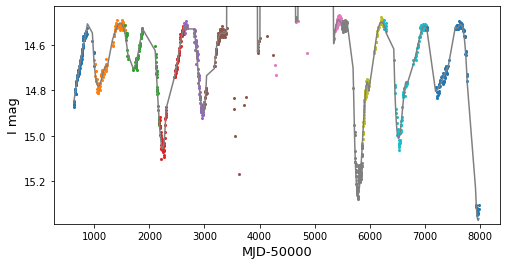

In [146]:
tab = orbchunks(7,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

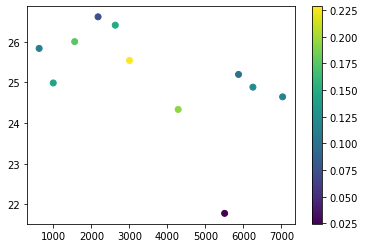

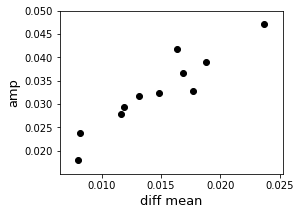

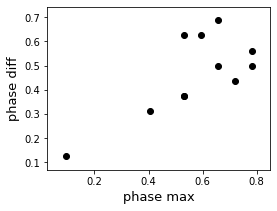

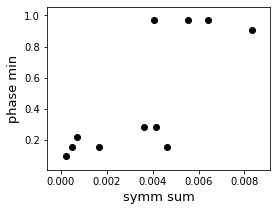

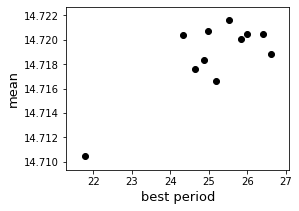

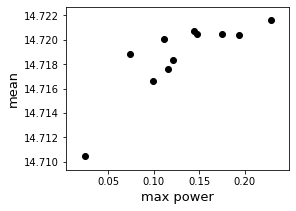

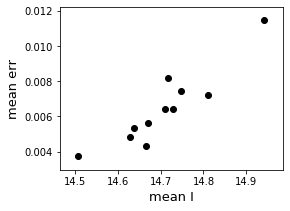

In [147]:
#higher power at lower magnitude, potentially interesting oscillation, one agreement with X-ray
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

In [150]:
alls[alls['src_n']==8]['aperiodic']

6    YES
Name: aperiodic, dtype: object

In [151]:
#classified as aperiodic anyway
# tab = orbchunks(8,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

9 chunks use min points rather than time


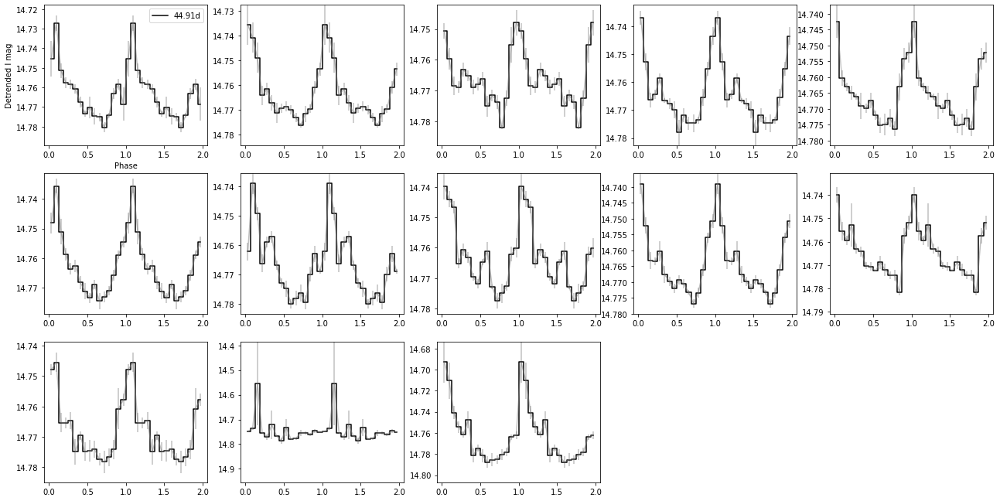

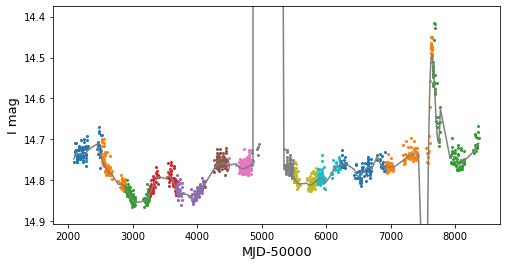

In [152]:
#very stable
tab = orbchunks(9,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

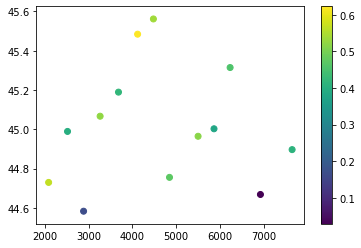

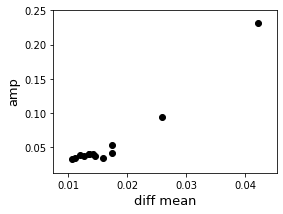

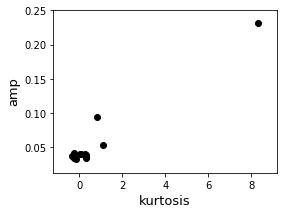

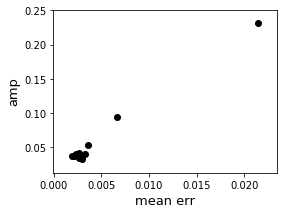

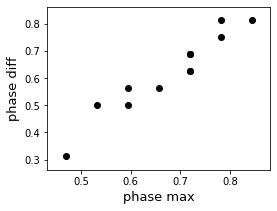

...

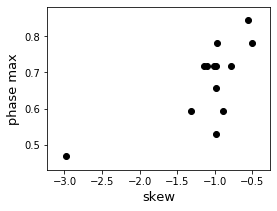

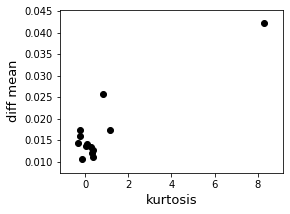

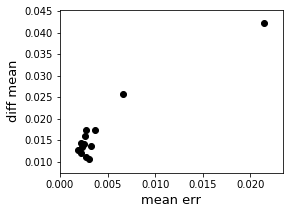

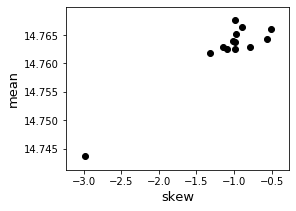

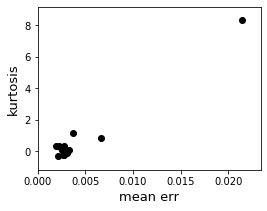

In [153]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

11 chunks use min points rather than time


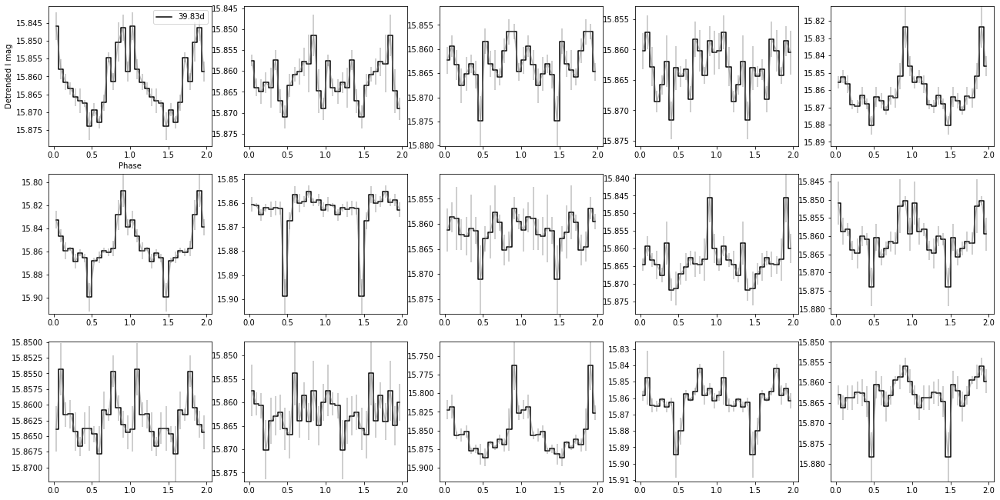

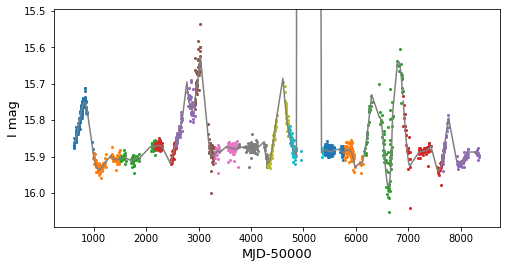

In [154]:
#interestin shape changes but period fairly stable; eclipse shape
tab = orbchunks(10,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

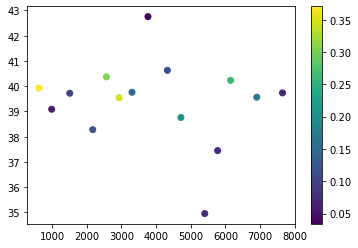

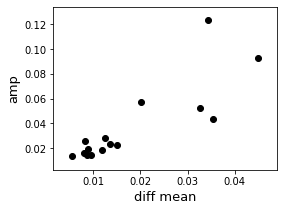

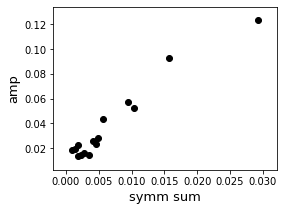

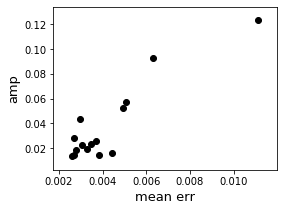

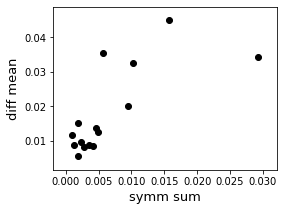

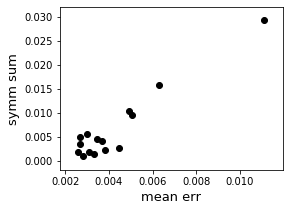

In [155]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

10 chunks use min points rather than time


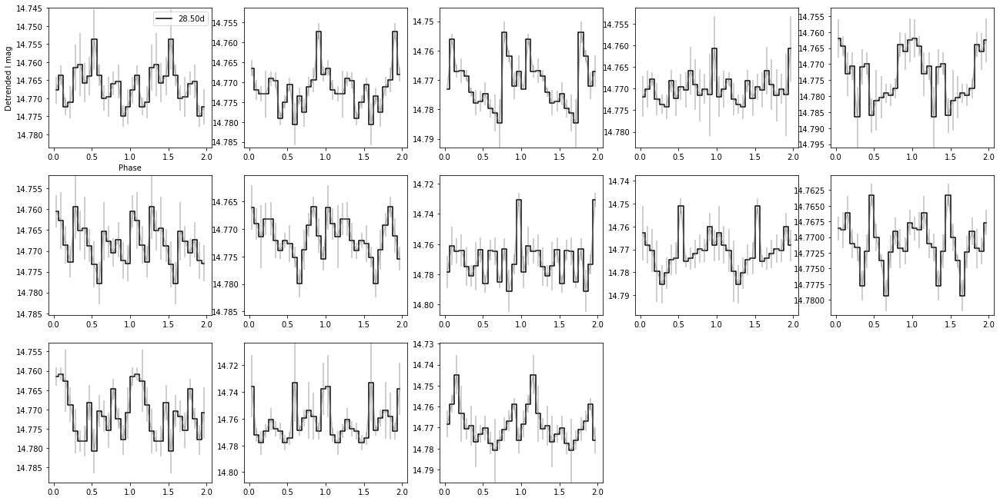

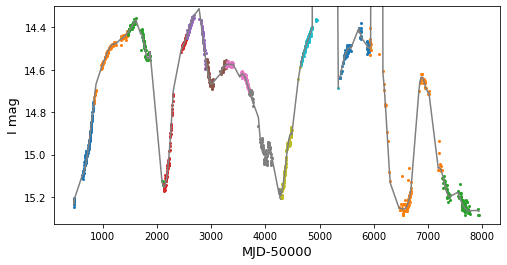

In [156]:
tab = orbchunks(11,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

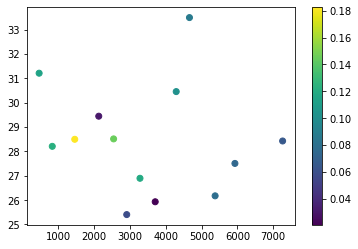

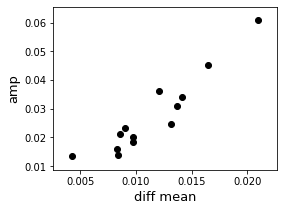

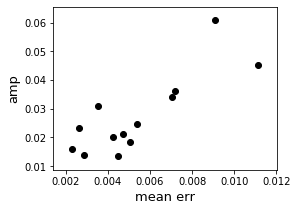

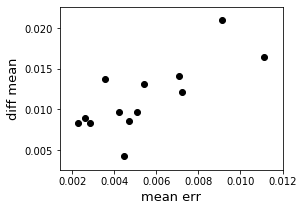

In [157]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

In [14]:
#established period from duplicate
alls[alls['src_n']==75]['est. period']

66    80.1
Name: est. period, dtype: float64

11 chunks use min points rather than time
established period: 77.2


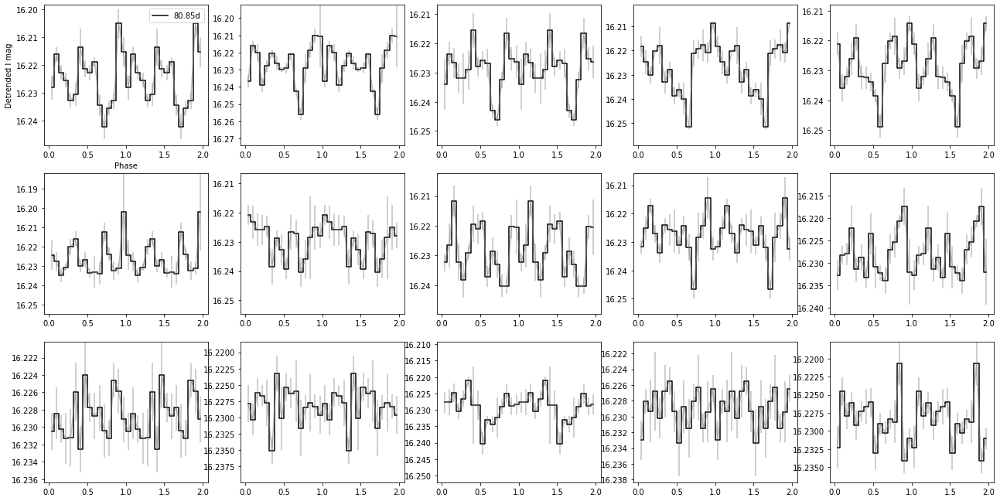

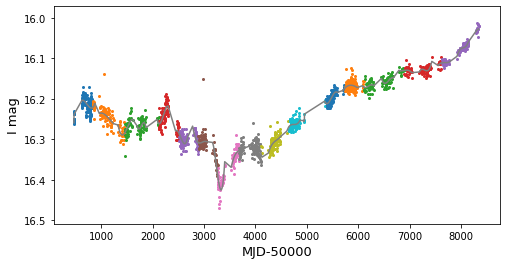

In [25]:
#signal not always great, even when the X-ray pds of 77.2, 80.1
tab = orbchunks(12,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

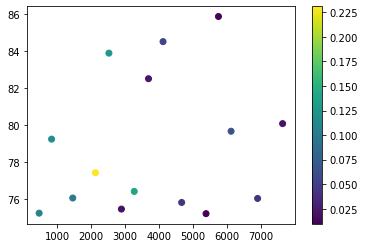

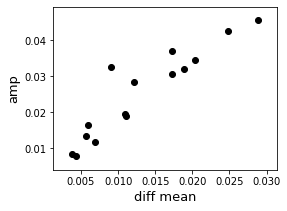

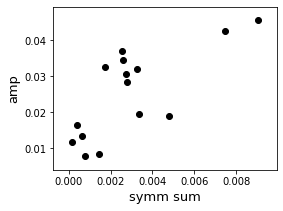

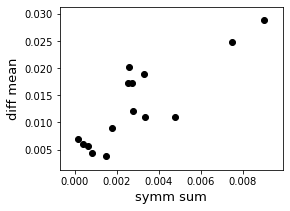

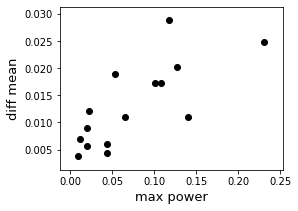

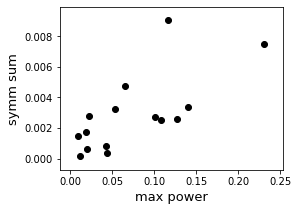

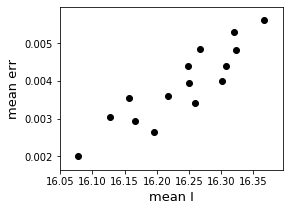

In [26]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

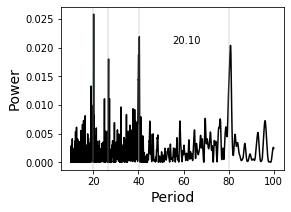

In [30]:
#quick search
iband = o.getIV(12,cross,both=False,stack=True)
o.splinedetrend(iband)
o.periodogram(iband,det=True,minp=10,maxp=100)
plt.axvline(80.1,color='darkseagreen',alpha=0.3)
plt.axvline(80.1/2,color='darkseagreen',alpha=0.3)
plt.axvline(80.1/3,color='darkseagreen',alpha=0.3)
plt.axvline(80.1/4,color='darkseagreen',alpha=0.3)


7 chunks use min points rather than time
established period: 36.3


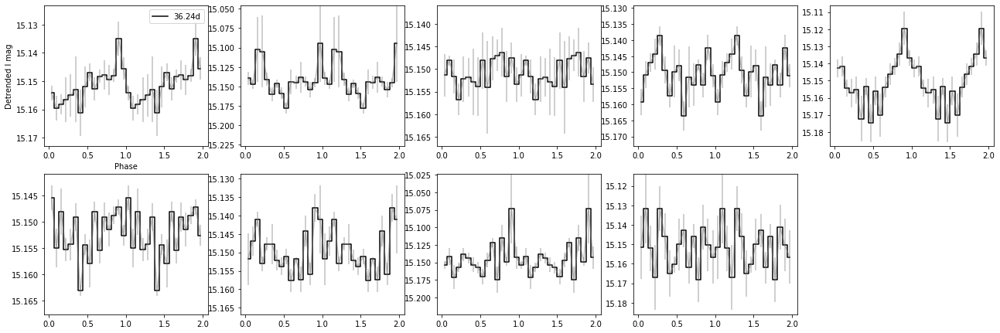

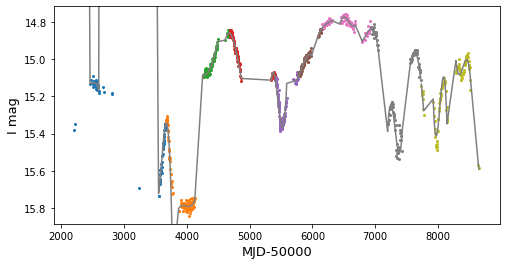

In [41]:
#perhaps est. period better (e.g., last chunk)
tab = orbchunks(13,36.3,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

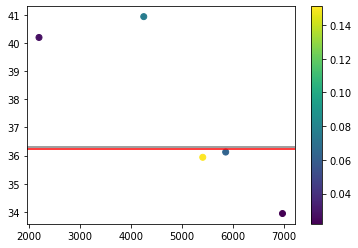

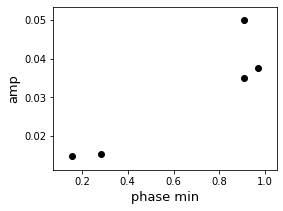

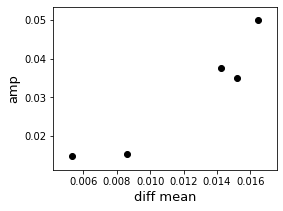

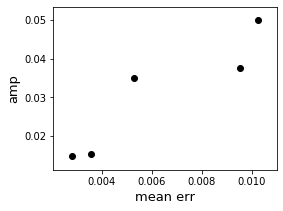

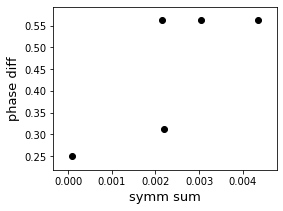

...

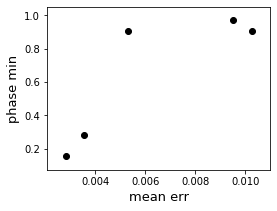

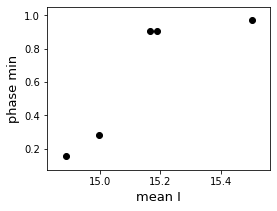

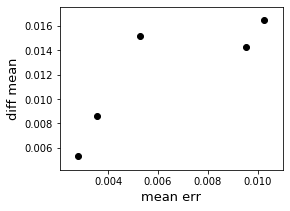

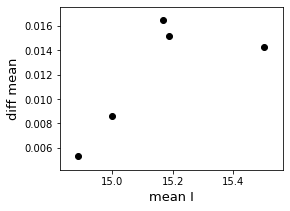

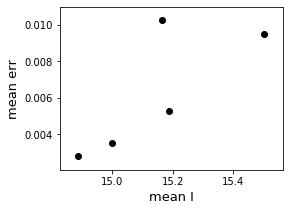

In [40]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.axhline(36.3,color='grey',label='est. period')
plt.axhline(36.24,color='red',label='best auto det pd')

plt.colorbar()
plotcorr(tab,minc=.7)

3 chunks use min points rather than time
established period: 35.6


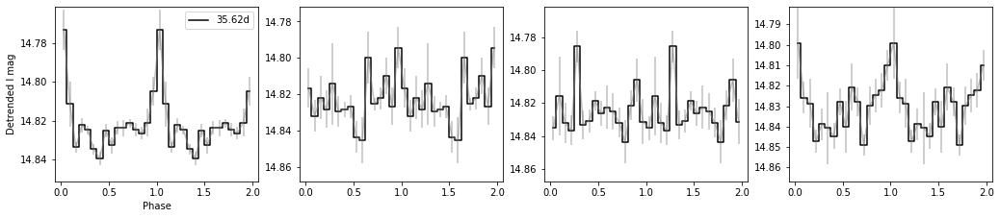

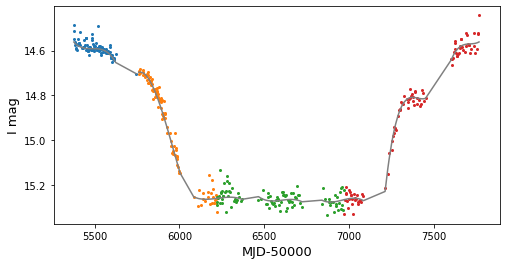

In [42]:
tab = orbchunks(14,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False)

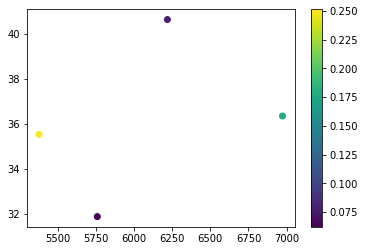

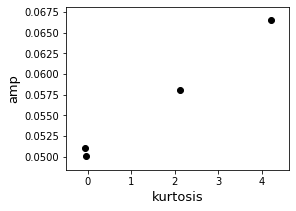

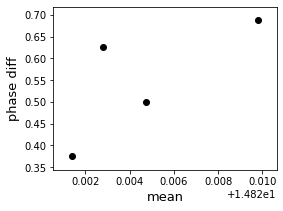

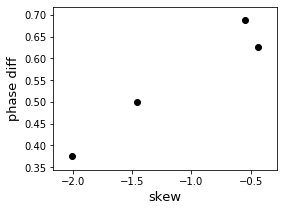

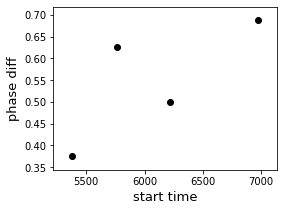

...

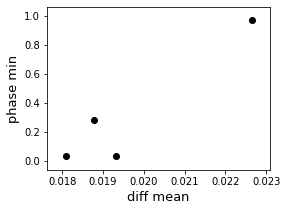

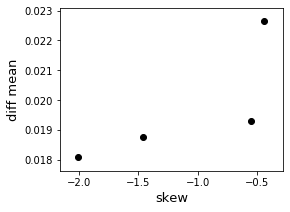

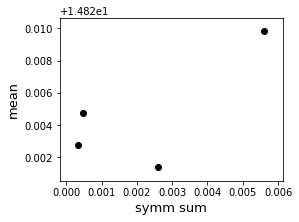

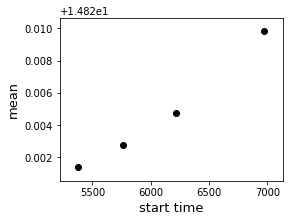

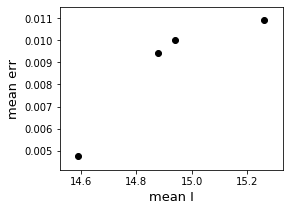

In [43]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])

plt.colorbar()
plotcorr(tab,minc=.7)

11 chunks use min points rather than time
established period: 0.0


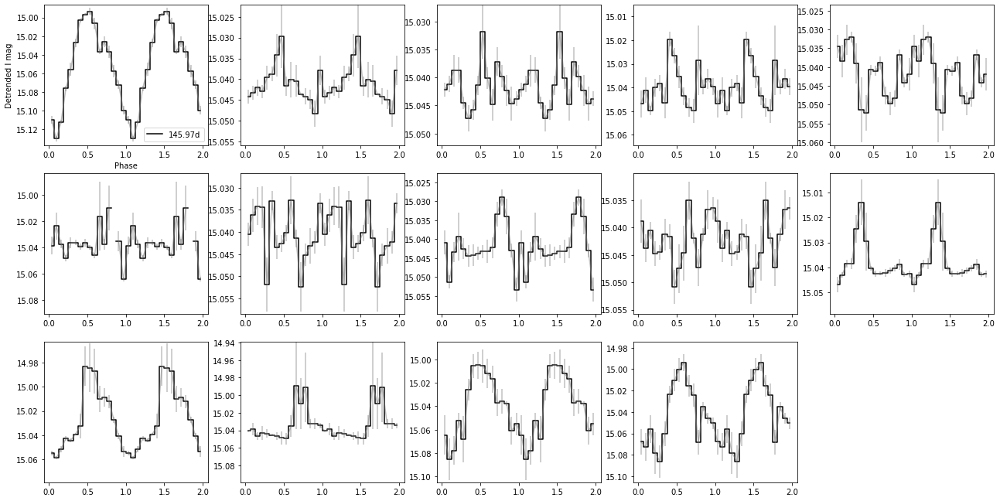

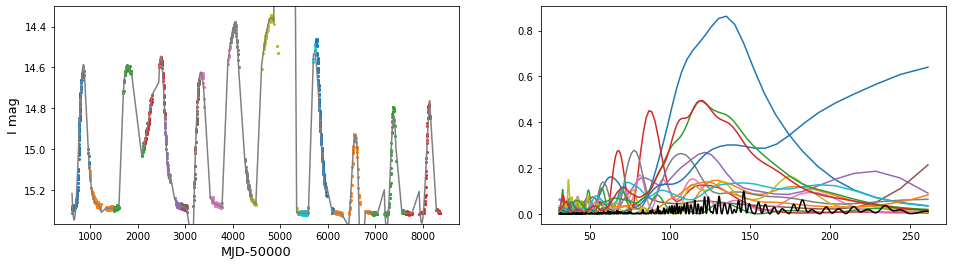

In [139]:
#promising period but large error bars; first and last few look good with large range of periods
#really wide peak is from first cut
tab = orbchunks(15,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=100)

In [140]:
tab['max power'][:2]

0    0.862839
1    0.146479
Name: max power, dtype: float64

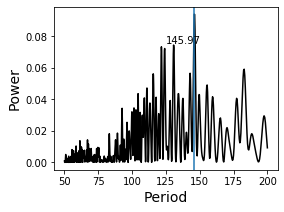

In [141]:
iband = o.getIV(15,cross,stack=True,both=False)
o.splinedetrend(iband)
o.periodogram(iband,minp=50,maxp=200,det=True)
plt.axvline(145.97)

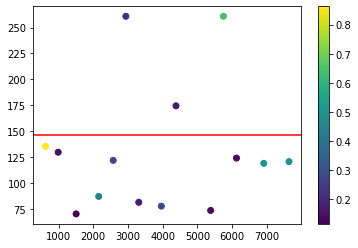

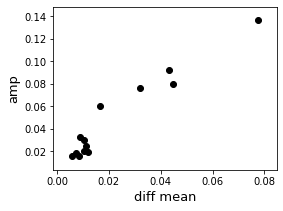

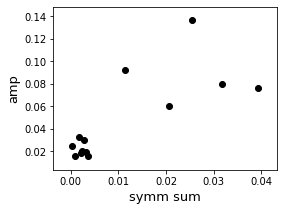

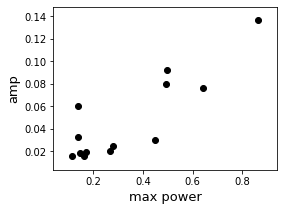

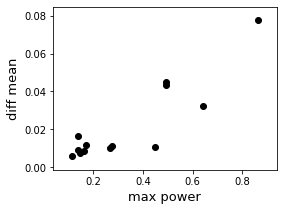

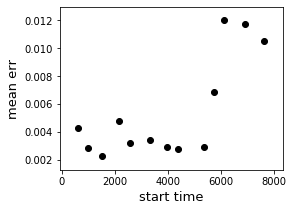

In [142]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.axhline(145.97,color='red')
plt.colorbar()
plotcorr(tab,minc=.7)

11 chunks use min points rather than time


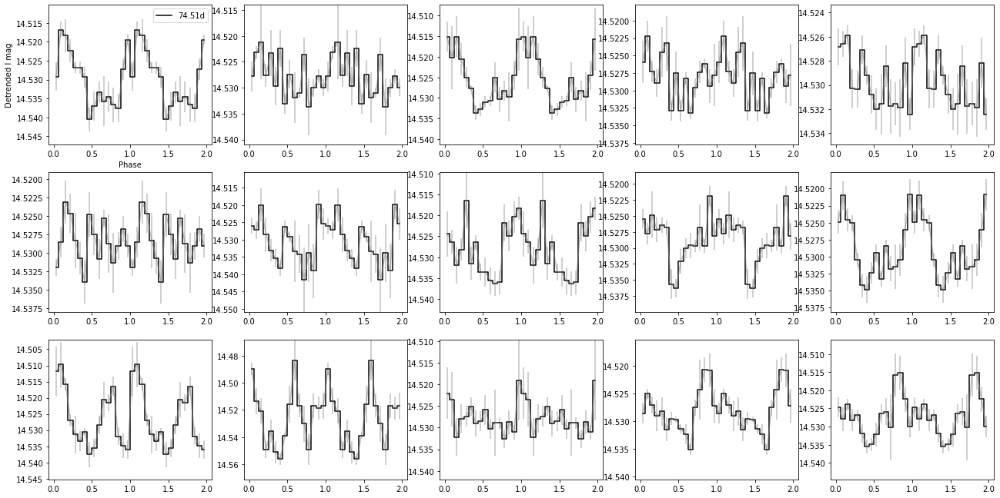

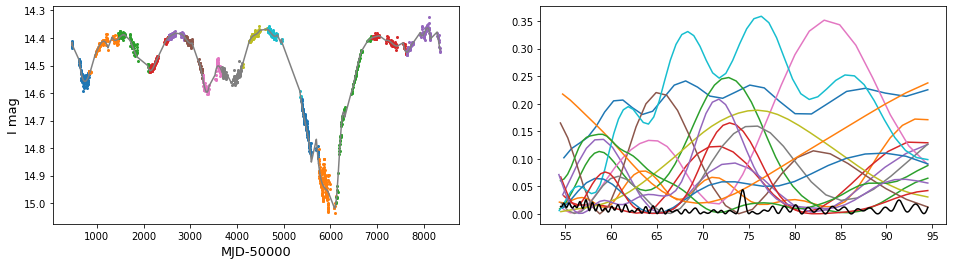

In [143]:
tab = orbchunks(16,74.51,num=365,time=True,minp=100,pbins=16,det=True,findpd=False,plotlc=True,save=False,file='',getstd=False,width=20)

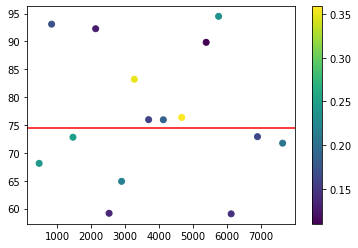

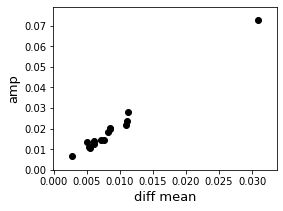

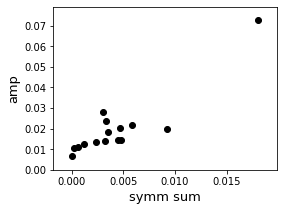

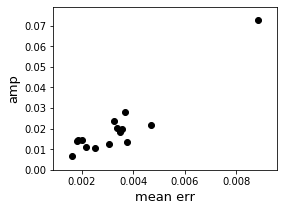

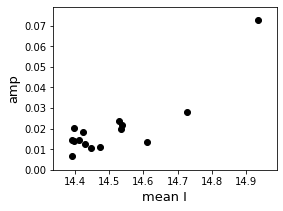

...

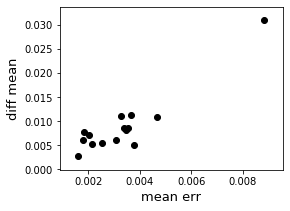

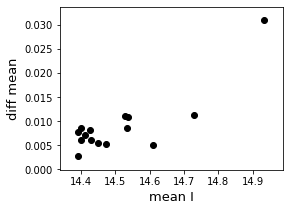

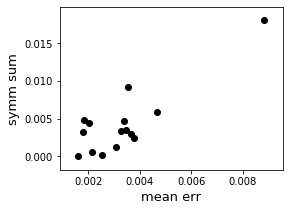

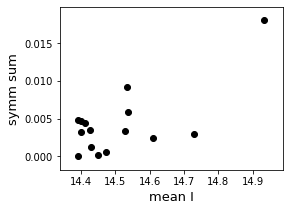

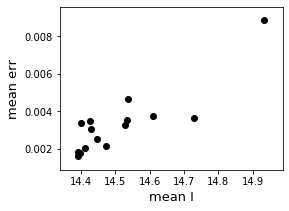

In [144]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(74.51,color='red')
plotcorr(tab,minc=.7)

9 chunks use min points rather than time


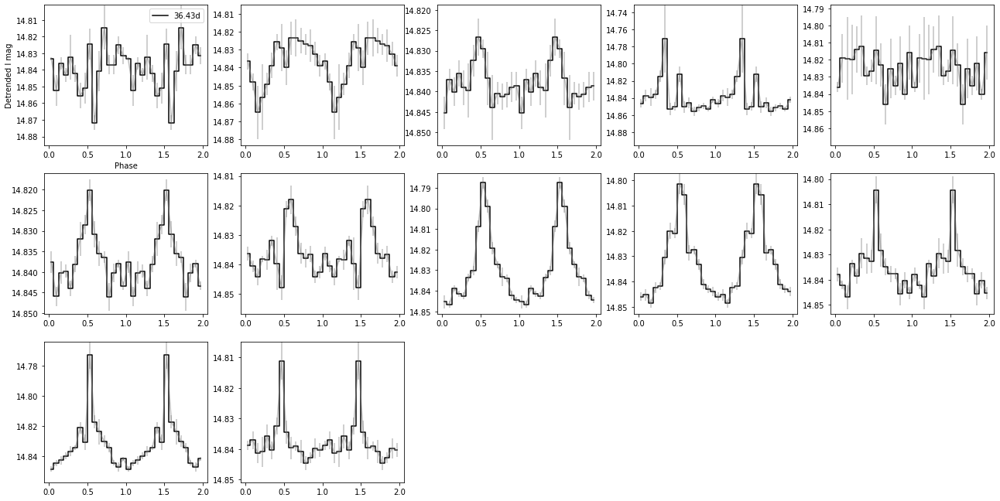

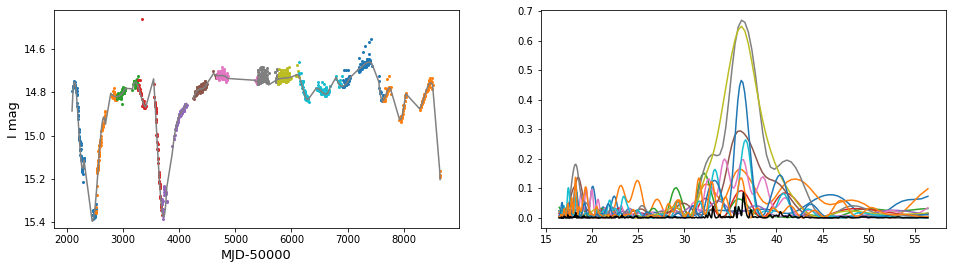

In [145]:
tab = orbchunks(17,36.43182,num=365,time=True,minp=100,pbins=16,det=True,findpd=False,plotlc=True,save=True,file='src17yearfolds',getstd=False,width=20)
#one disappearance during dip, one when coming back up

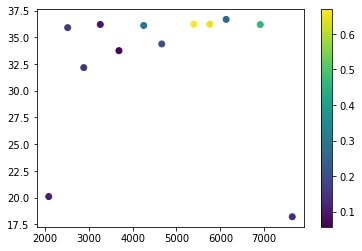

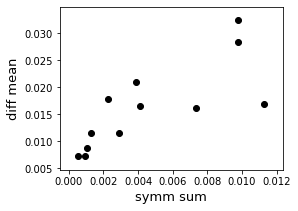

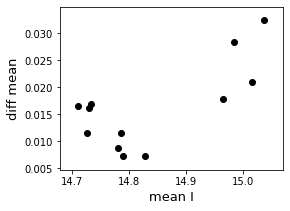

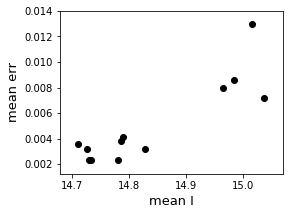

In [146]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
# plt.axhline(74.51,color='red')
plotcorr(tab,minc=.7)

6 chunks use min points rather than time
established period: 17.79


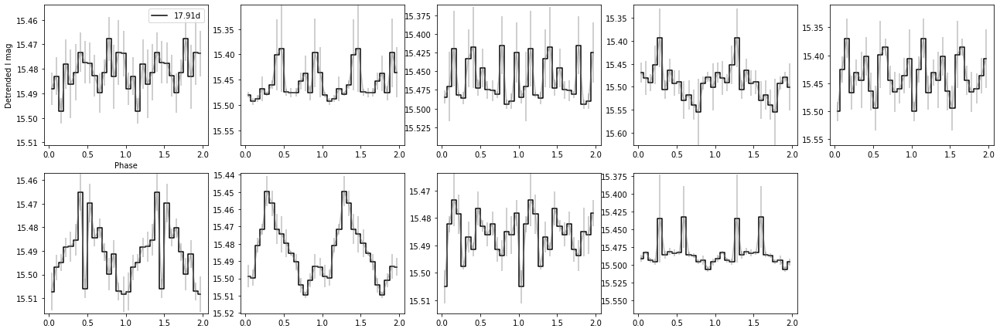

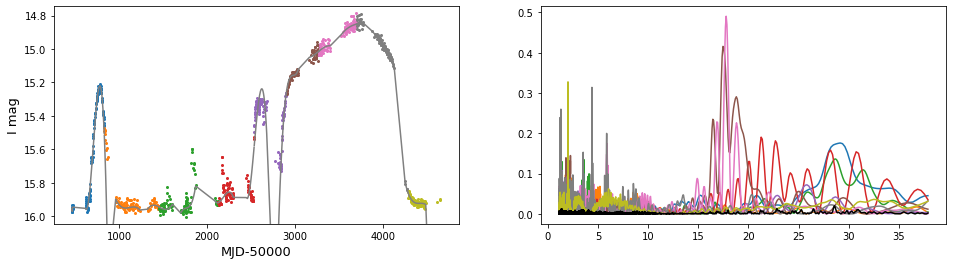

In [147]:
#est. period looks very similar
#best profile during pink part
#increasing time doesn't necessarily help
tab = orbchunks(19,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

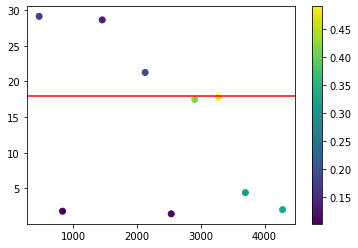

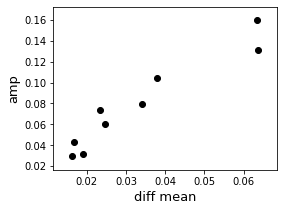

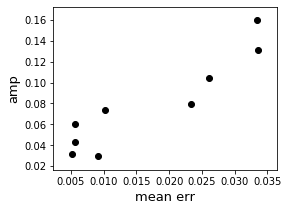

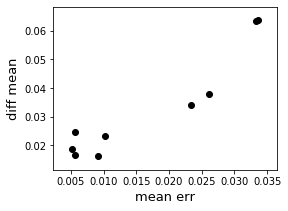

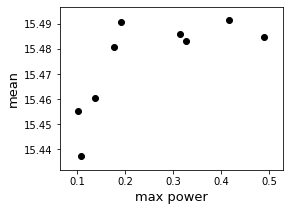

In [148]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(17.91,color='red')
plotcorr(tab,minc=.7)

8 chunks use min points rather than time
established period: 75.97


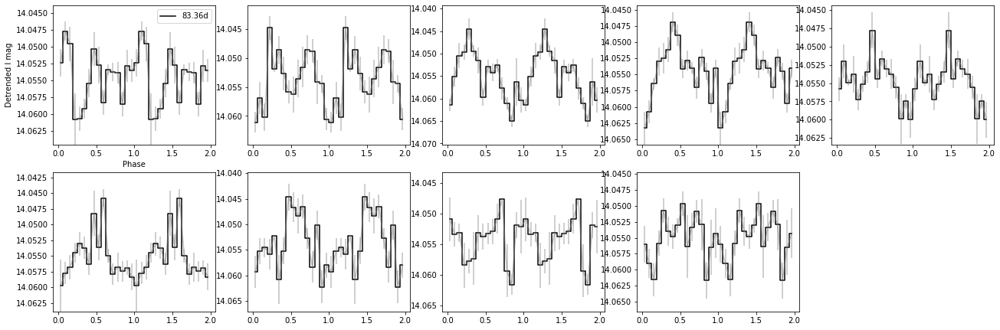

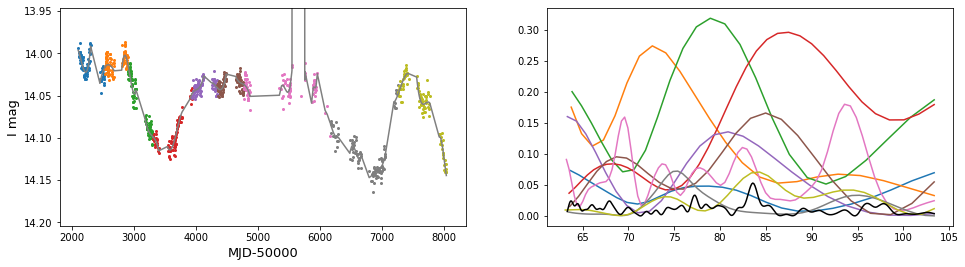

In [149]:
#est. period not necessarily better
tab = orbchunks(20,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='src20yearfolds',getstd=False,width=20)

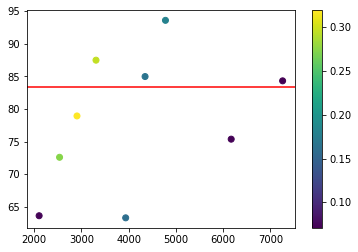

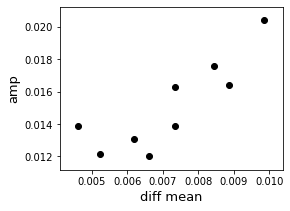

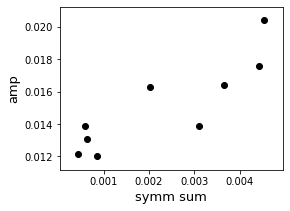

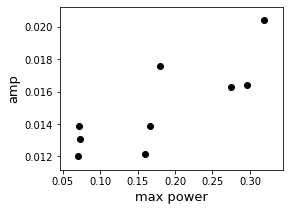

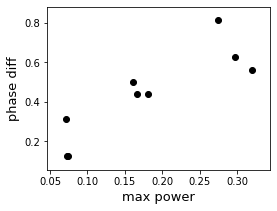

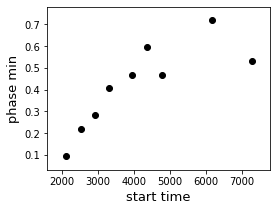

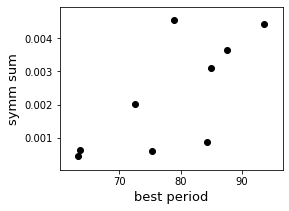

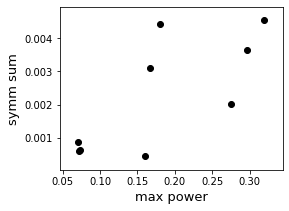

In [150]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(83.36,color='red')
plotcorr(tab,minc=.7)

11 chunks use min points rather than time
established period: 22.5


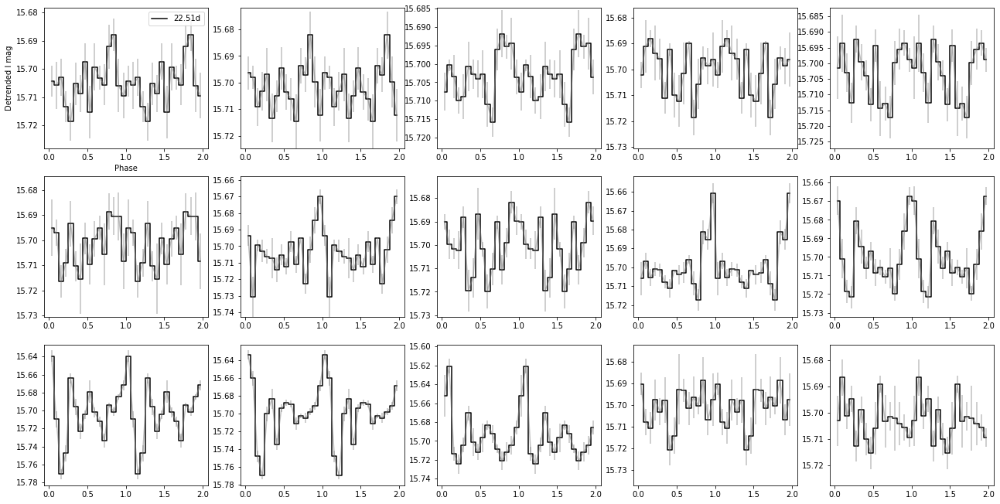

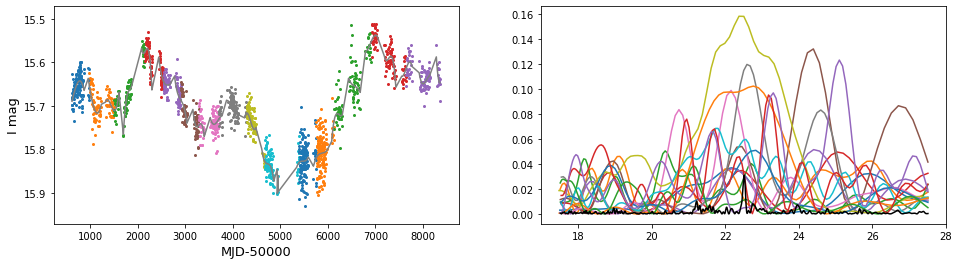

In [151]:
#look into aliases; cutting down on width
tab = orbchunks(21,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=5)

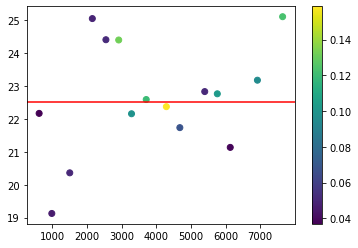

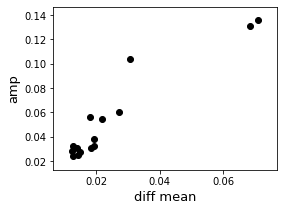

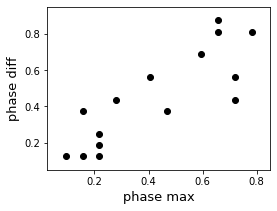

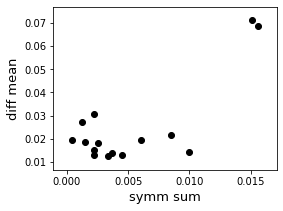

In [152]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(22.5,color='red')
plotcorr(tab,minc=.7)

9 chunks use min points rather than time
established period: 90.5


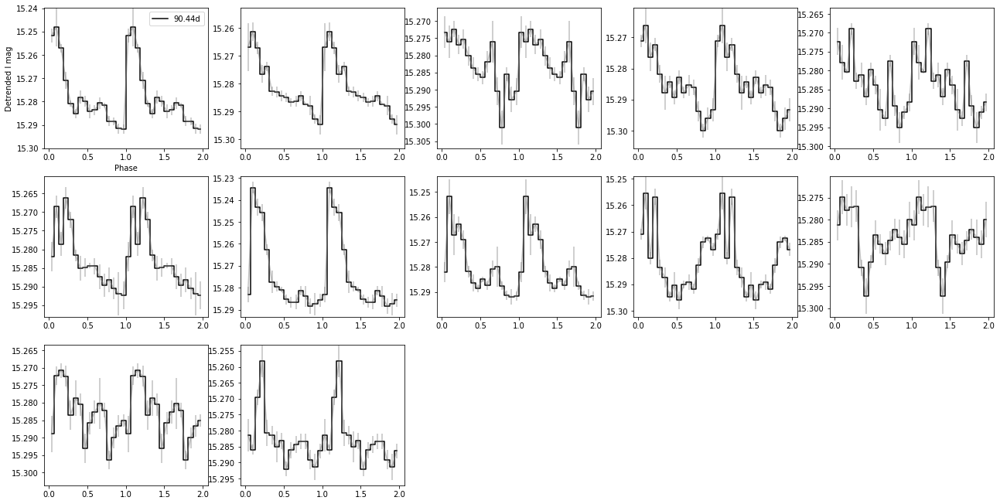

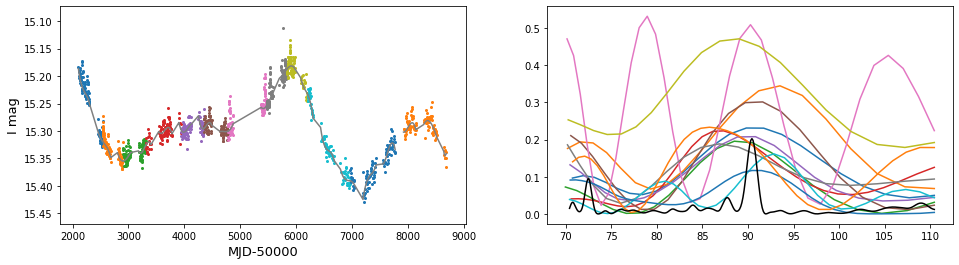

In [153]:
#fairly but not completely stable
tab = orbchunks(22,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

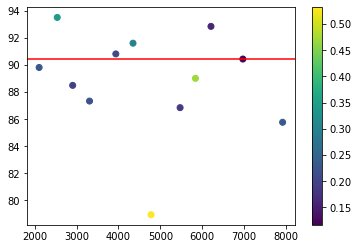

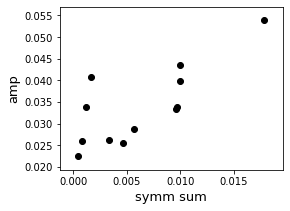

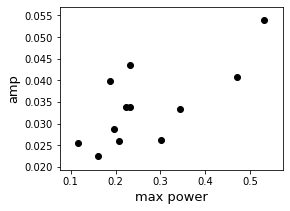

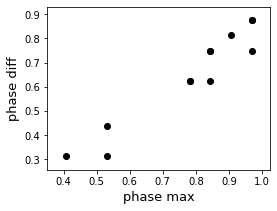

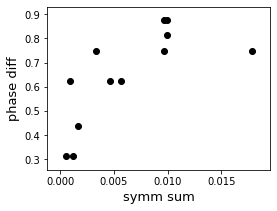

In [154]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(90.44,color='red')
plotcorr(tab,minc=.7)

10 chunks use min points rather than time
established period: 137.36


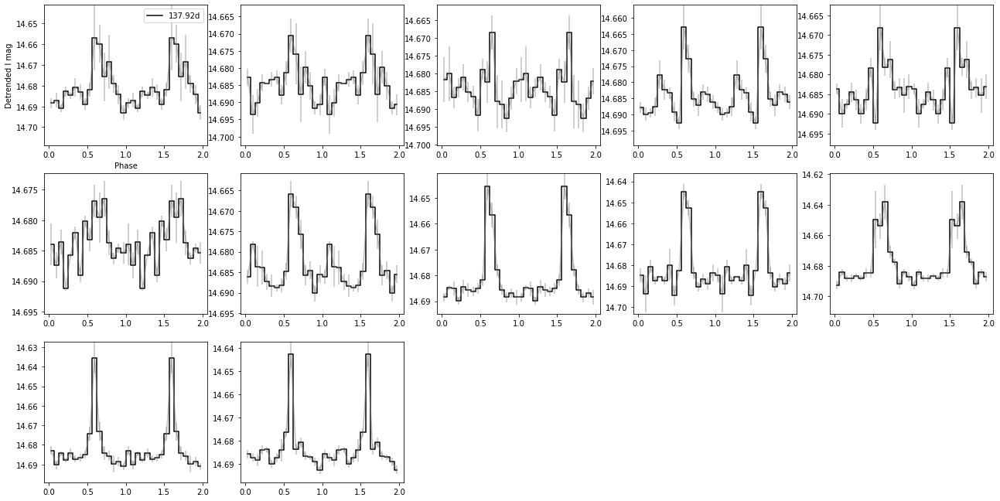

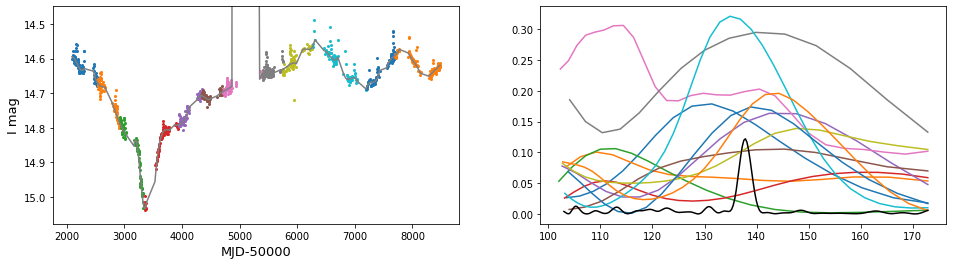

In [155]:
#est not better
tab = orbchunks(23,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

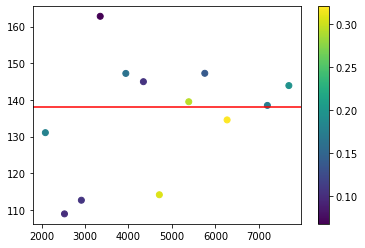

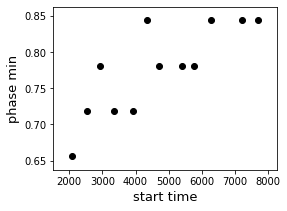

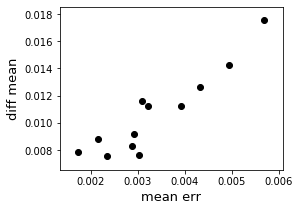

In [157]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(138,color='red')
plotcorr(tab,minc=.7)

12 chunks use min points rather than time
established period: 62.1


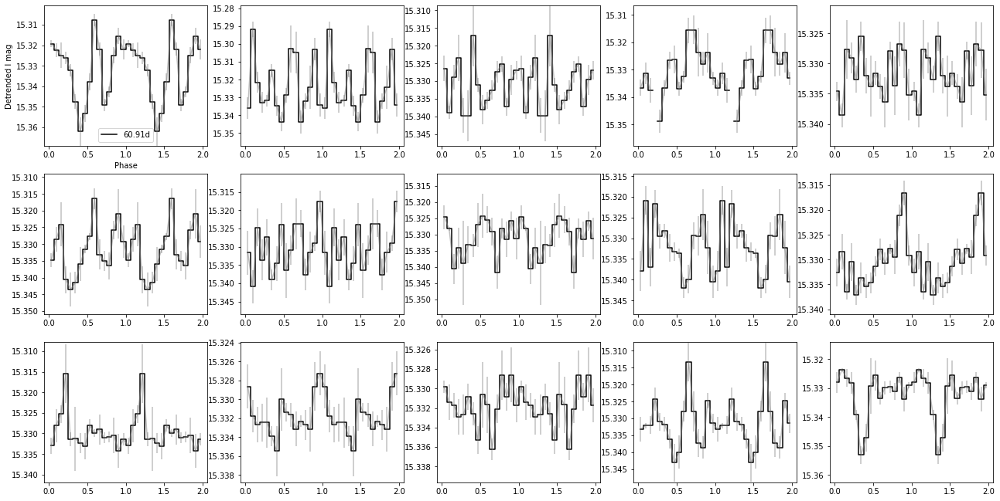

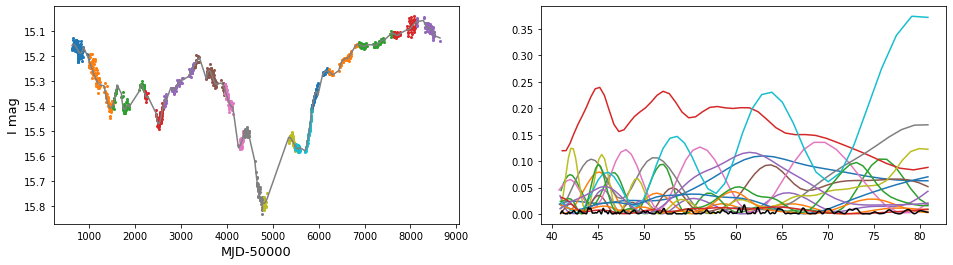

In [158]:
#est not better
tab = orbchunks(24,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

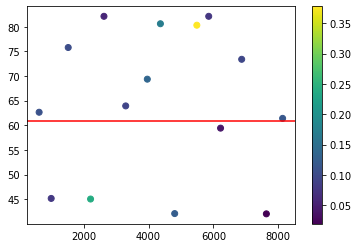

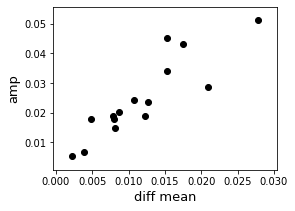

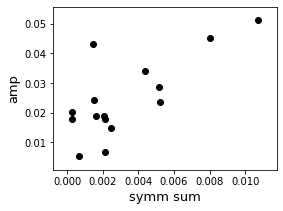

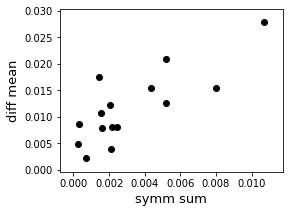

In [160]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(60.9,color='red')
plotcorr(tab,minc=.7)

empty file for OIII I
5 chunks use min points rather than time
established period: 110.6


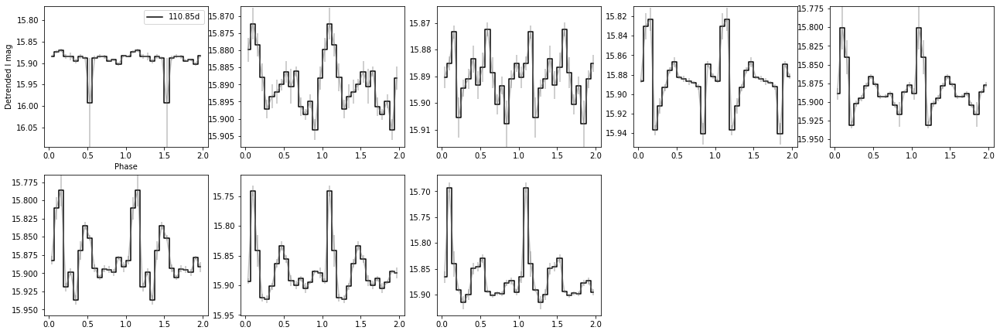

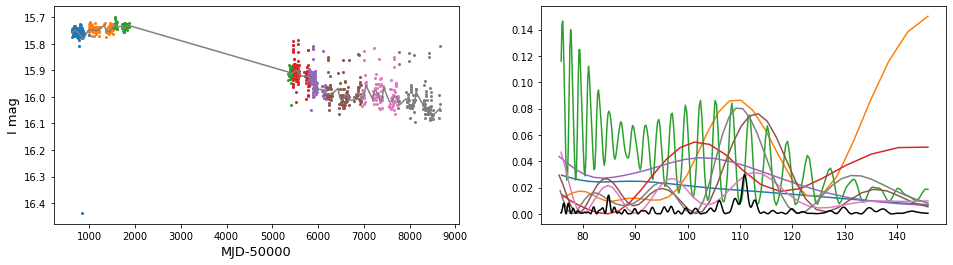

In [161]:
#same without detrending
tab = orbchunks(25,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

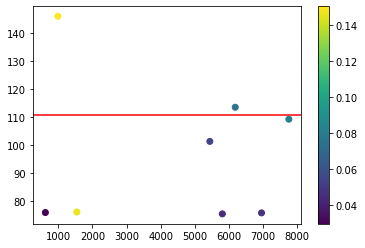

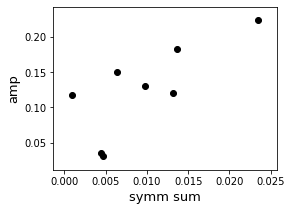

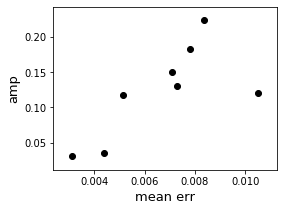

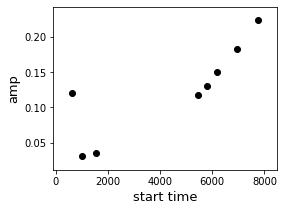

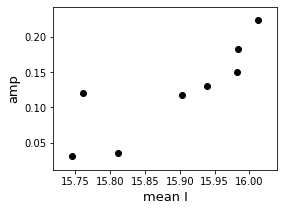

...

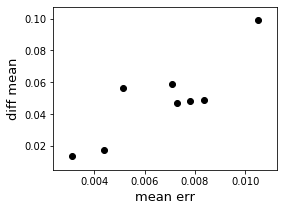

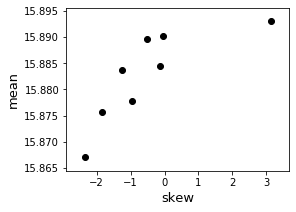

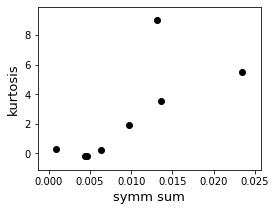

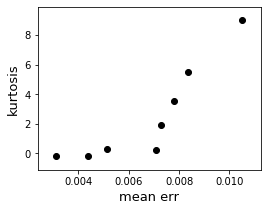

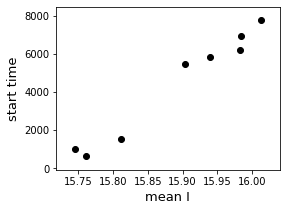

In [162]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(110.85,color='red')
plotcorr(tab,minc=.7)

11 chunks use min points rather than time


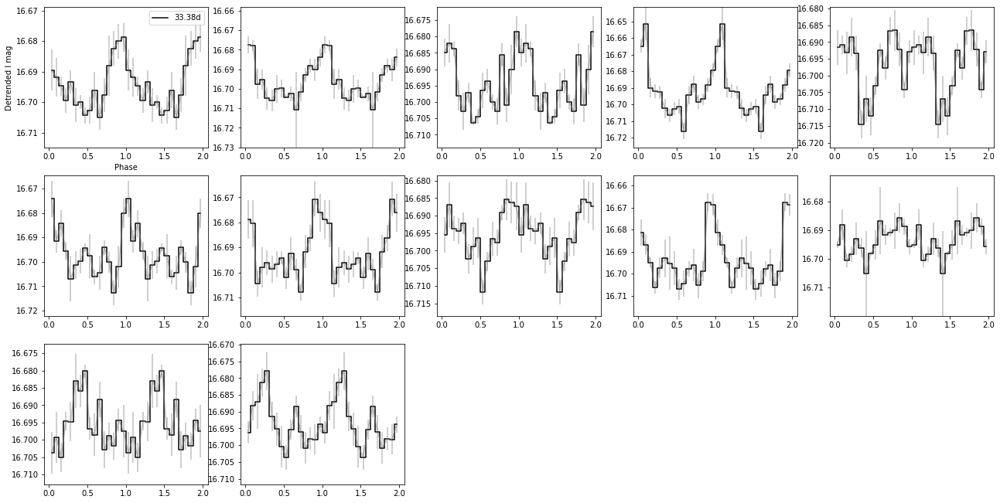

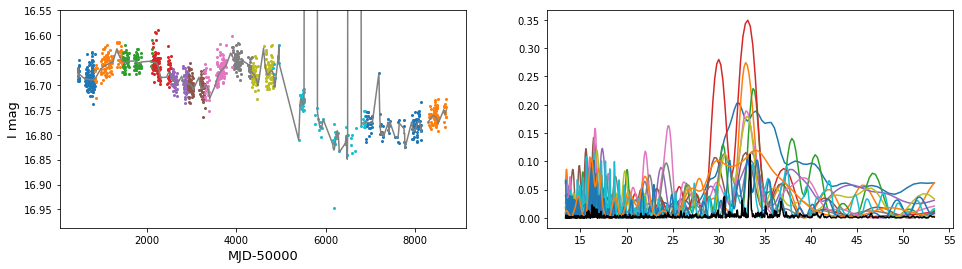

In [174]:
#using established
tab = orbchunks(26,33.38,num=365,time=True,minp=100,pbins=16,det=True,findpd=False,plotlc=True,save=False,file='src26yearfolds',getstd=False,width=20)

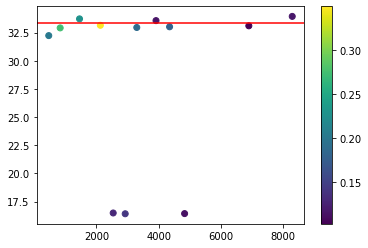

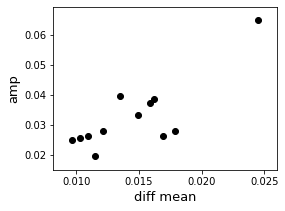

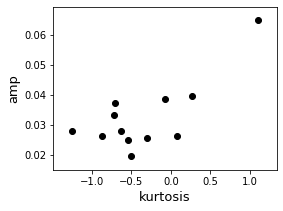

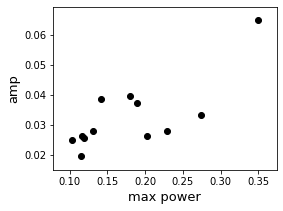

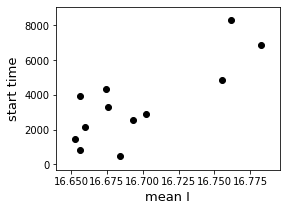

In [175]:
#anything significant in patterns like these? don't think so when more chunks used
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(33.38,color='red') #est
plotcorr(tab,minc=.7)

0 chunks use min points rather than time
established period: 362.3


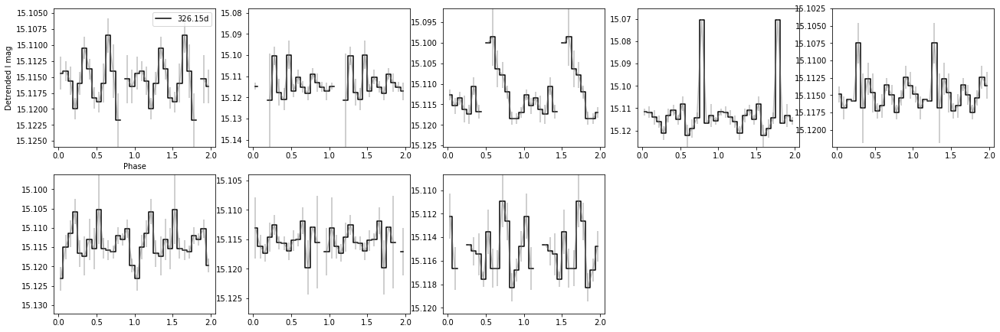

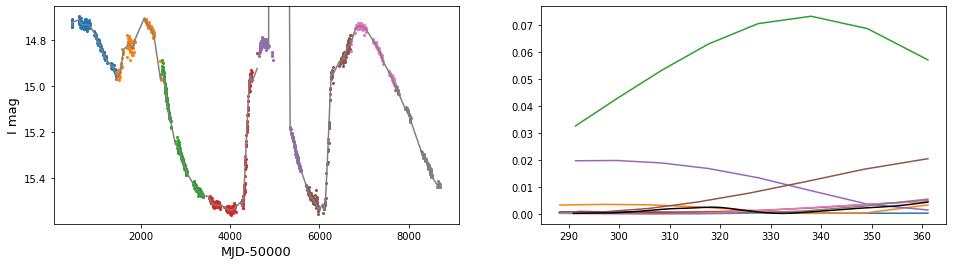

In [181]:
#hard to check with this method
tab = orbchunks(27,0,num=1000,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

10 chunks use min points rather than time
established period: 88.3


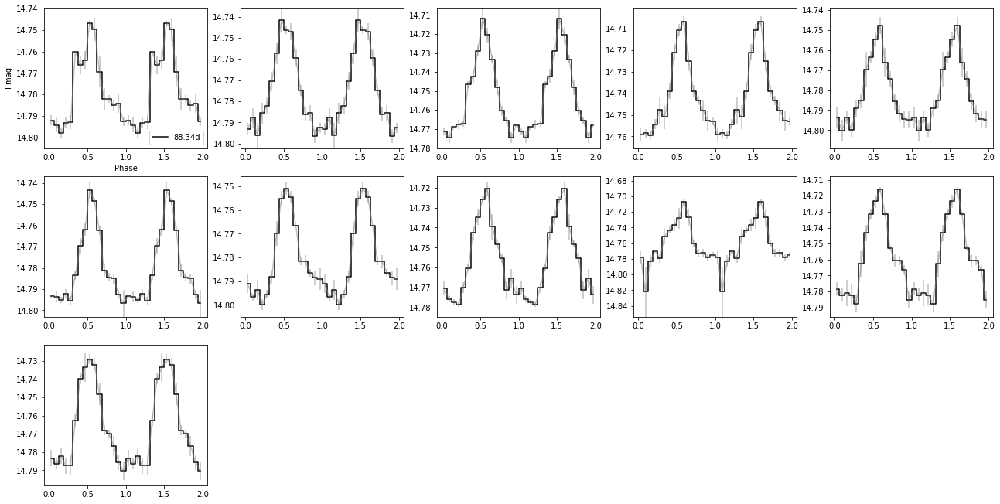

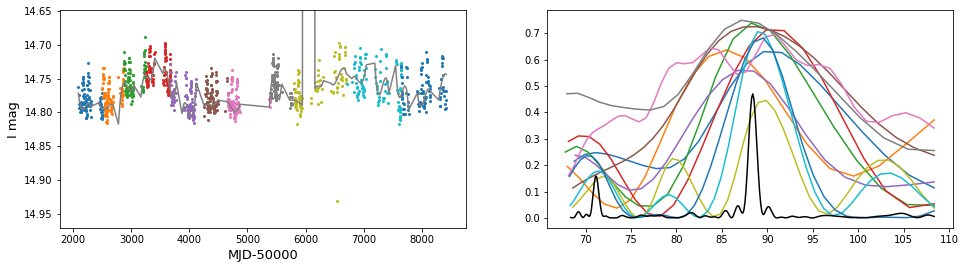

In [184]:
#best one thus far; looks similar with and without detrending
tab = orbchunks(28,0,num=365,time=True,minp=100,pbins=16,det=False,findpd=True,plotlc=True,save=False,file='src28yearfolds',getstd=False,width=20)

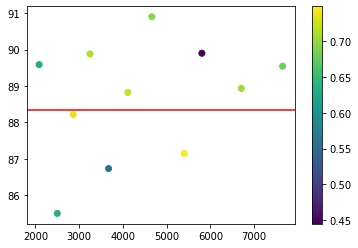

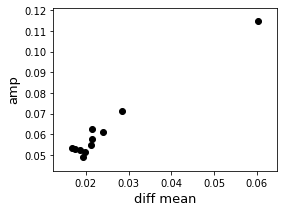

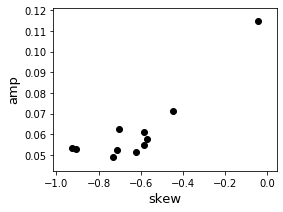

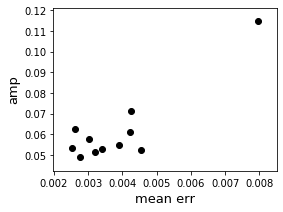

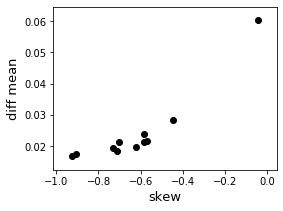

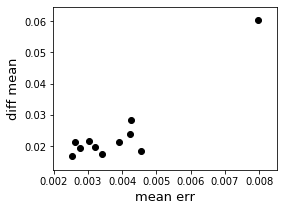

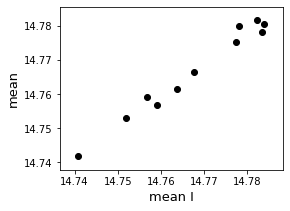

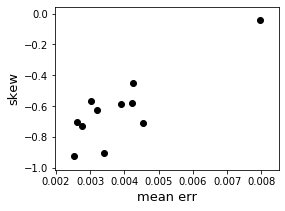

In [185]:
#keep in mind that hard to get precise, consistent period even for best source
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plt.axhline(88.34,color='red') #est
plotcorr(tab,minc=.7)

7 chunks use min points rather than time
established period: 21.95


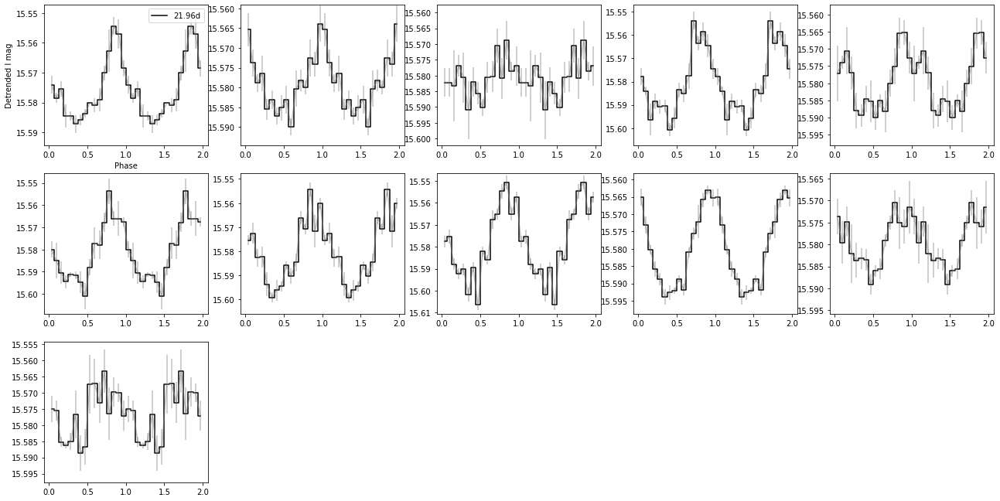

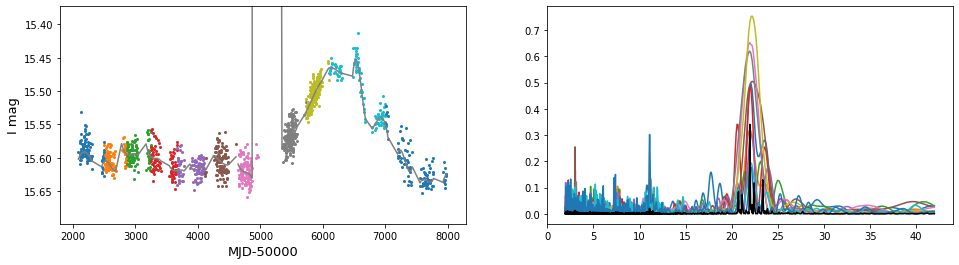

In [192]:
tab = orbchunks(30,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

### increasing skew with time??

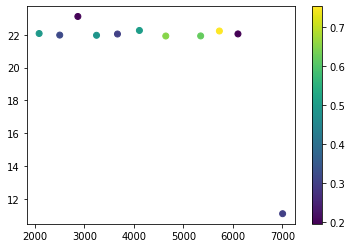

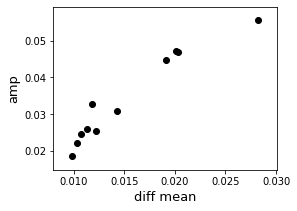

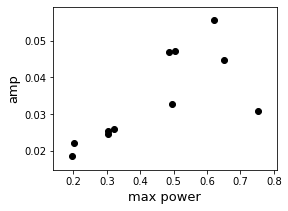

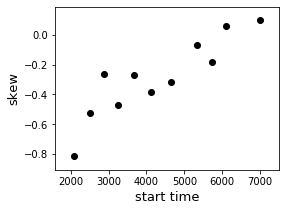

In [193]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

1 chunks use min points rather than time
established period: 103.6


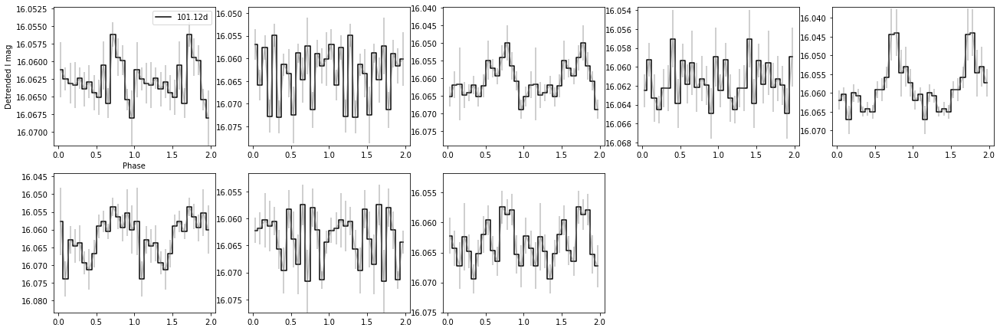

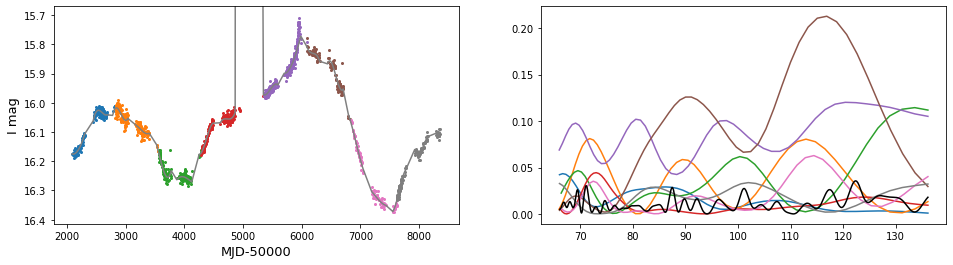

In [194]:
#testing two year intervals
#look into this source a bit more?
tab = orbchunks(31,103.6,num=365*2,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

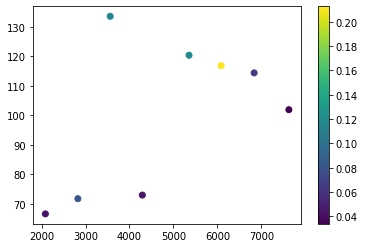

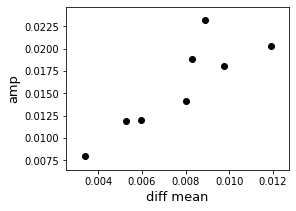

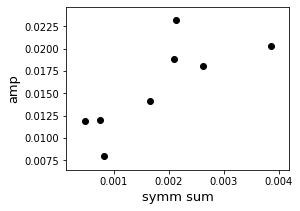

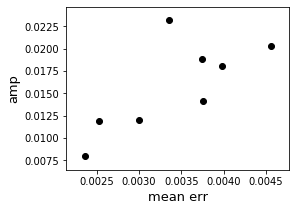

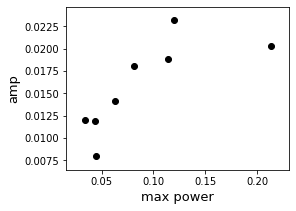

...

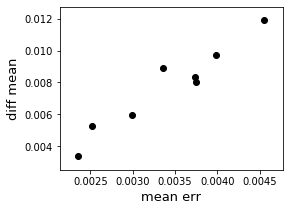

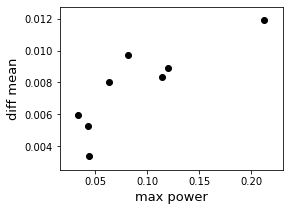

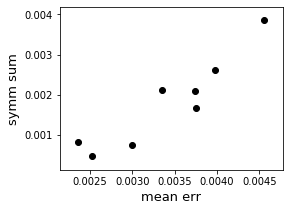

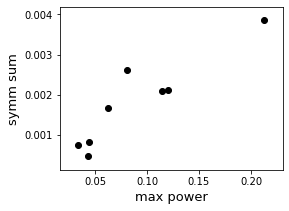

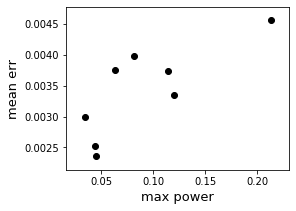

In [195]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

2 chunks use min points rather than time
established period: 197.0


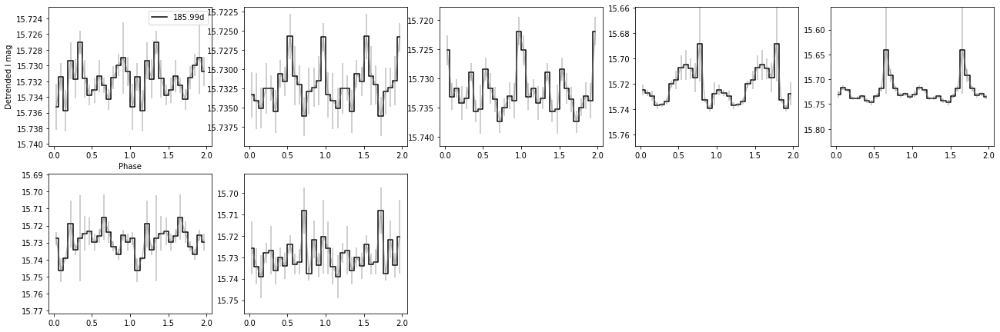

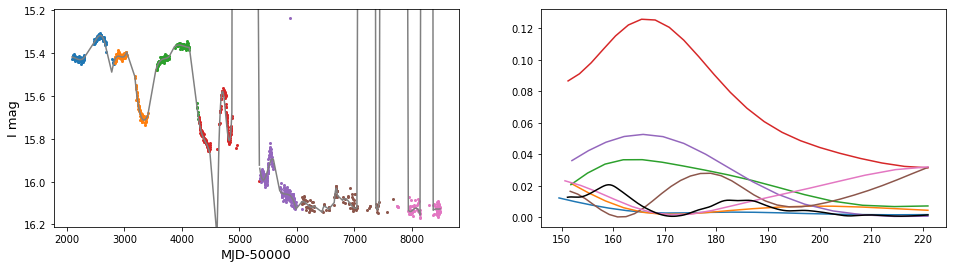

In [196]:
tab = orbchunks(32,0,num=365*2,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

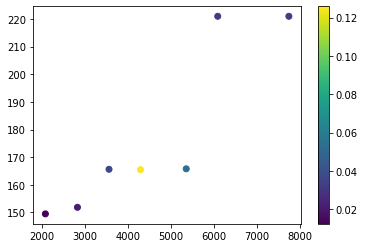

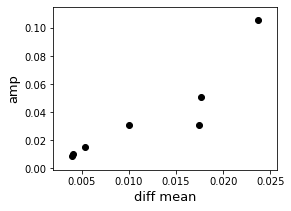

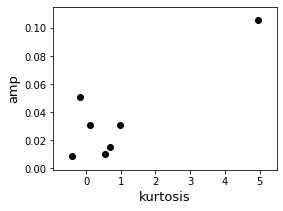

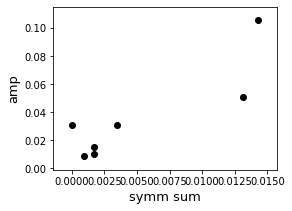

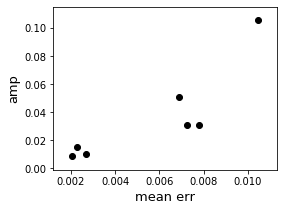

...

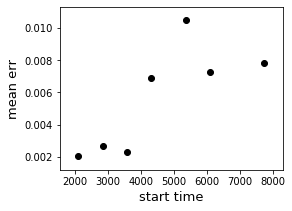

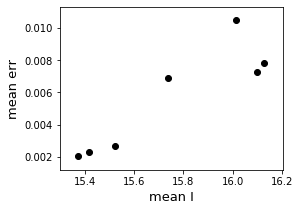

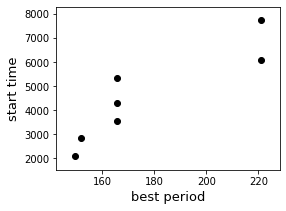

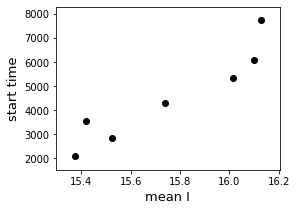

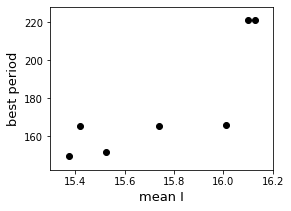

In [197]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

- look into correlation between best period and time (also I band since increasing with time)
- look into est. period

10 chunks use min points rather than time
established period: 0.0


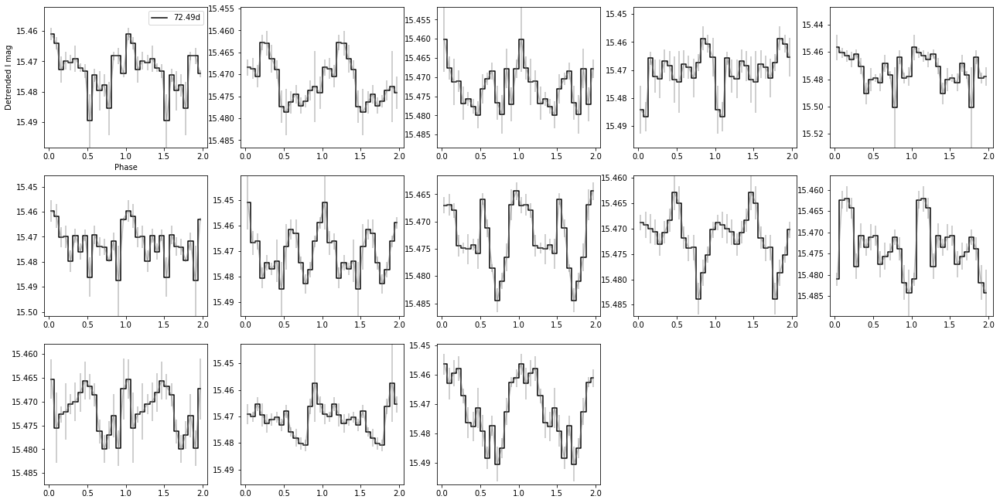

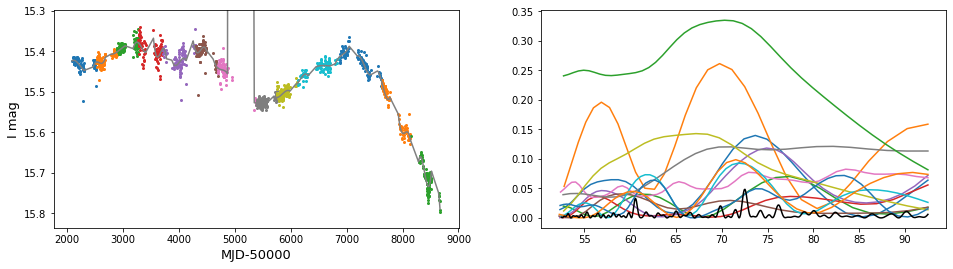

In [206]:
#phase 1 stability?
tab = orbchunks(34,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

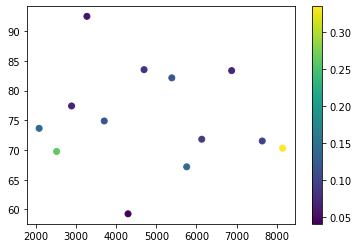

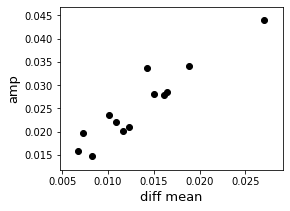

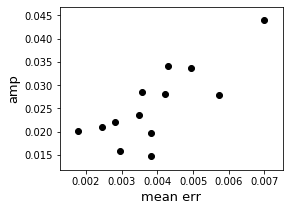

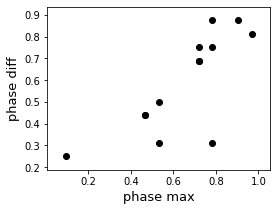

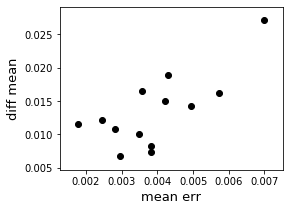

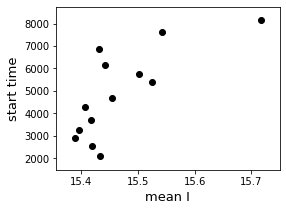

In [202]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

10 chunks use min points rather than time
established period: 0.0


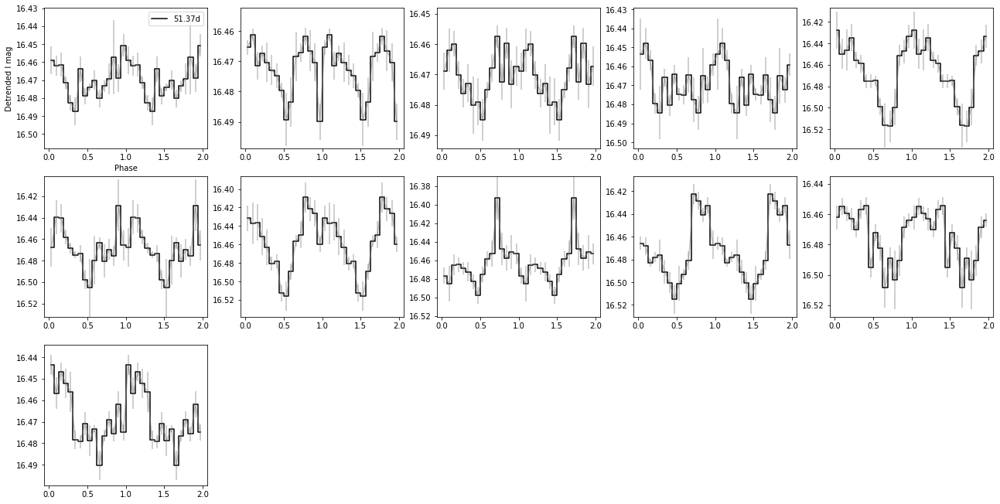

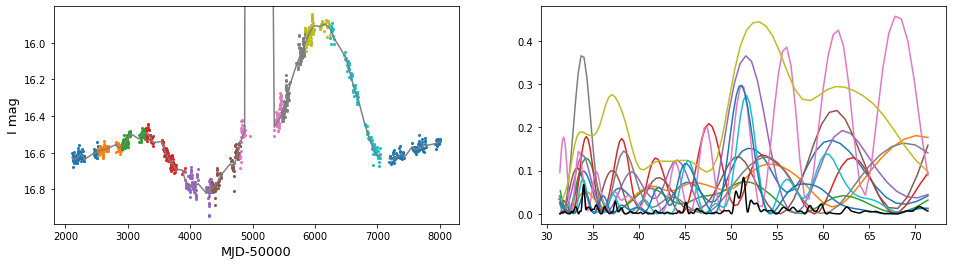

In [207]:
#imperfect phase stability -- try more periodograms and epoch-folding
tab = orbchunks(35,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

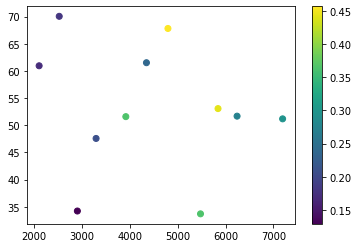

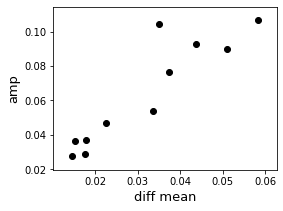

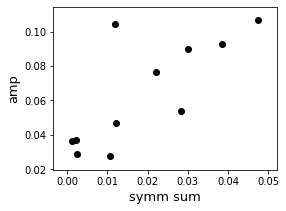

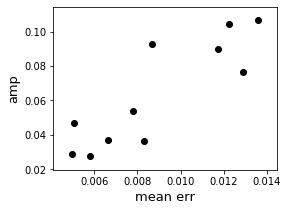

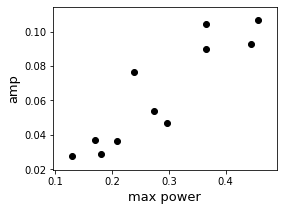

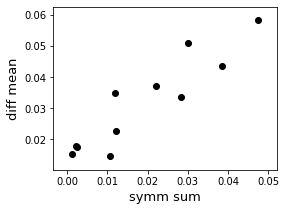

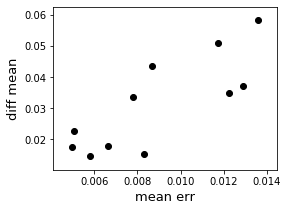

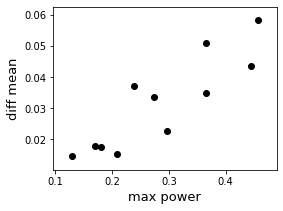

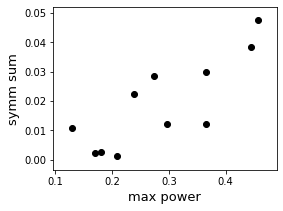

In [208]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

10 chunks use min points rather than time
established period: 68.54


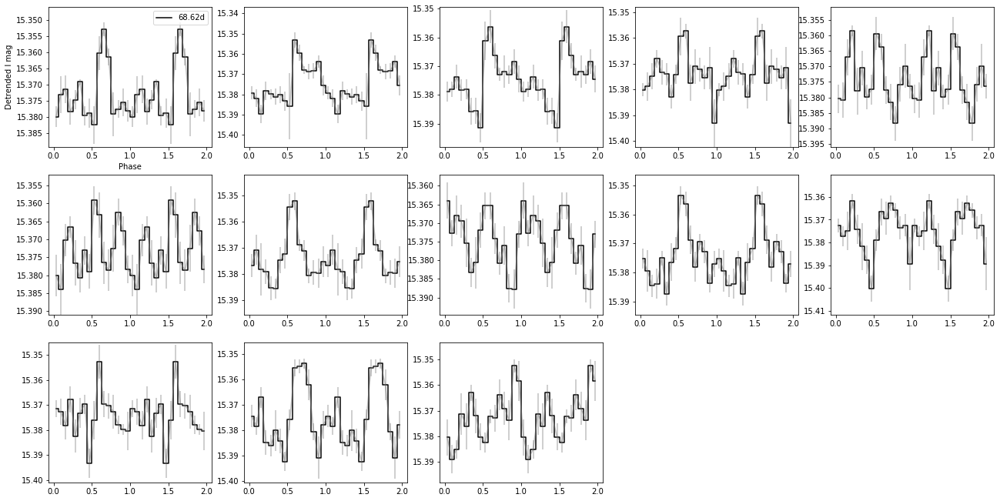

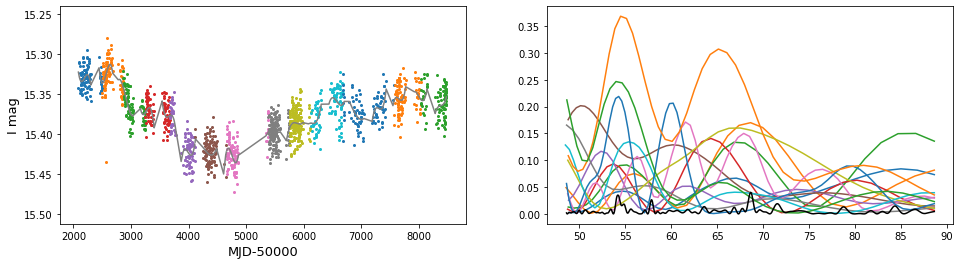

In [209]:
#weird features/shape changes but fairly stabel maximum loc
tab = orbchunks(36,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

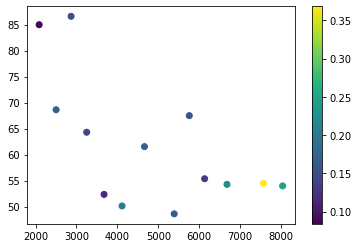

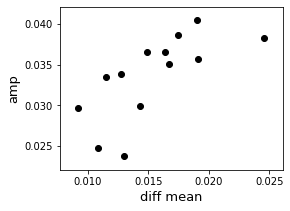

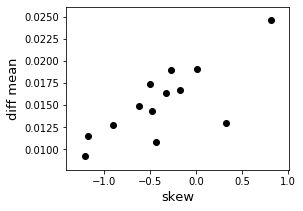

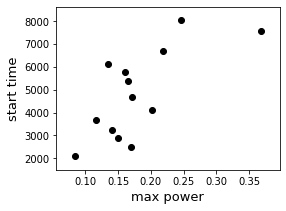

In [210]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

11 chunks use min points rather than time
established period: 67.88


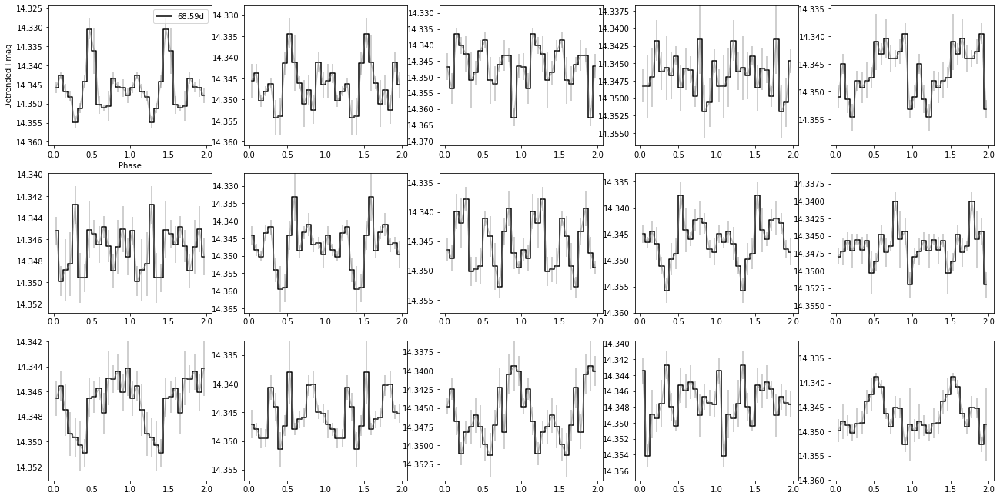

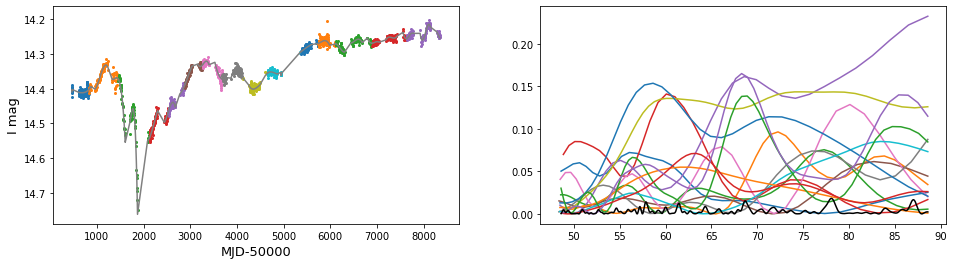

In [212]:
#decent but revisit
tab = orbchunks(37,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

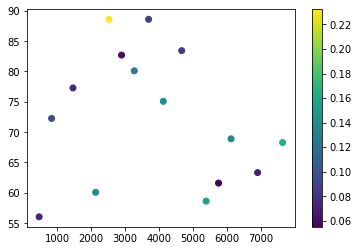

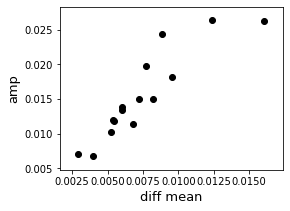

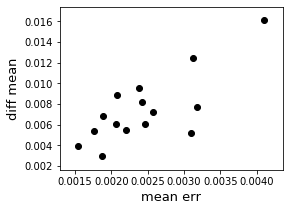

In [213]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

# START HERE

11 chunks use min points rather than time
established period: 0.0


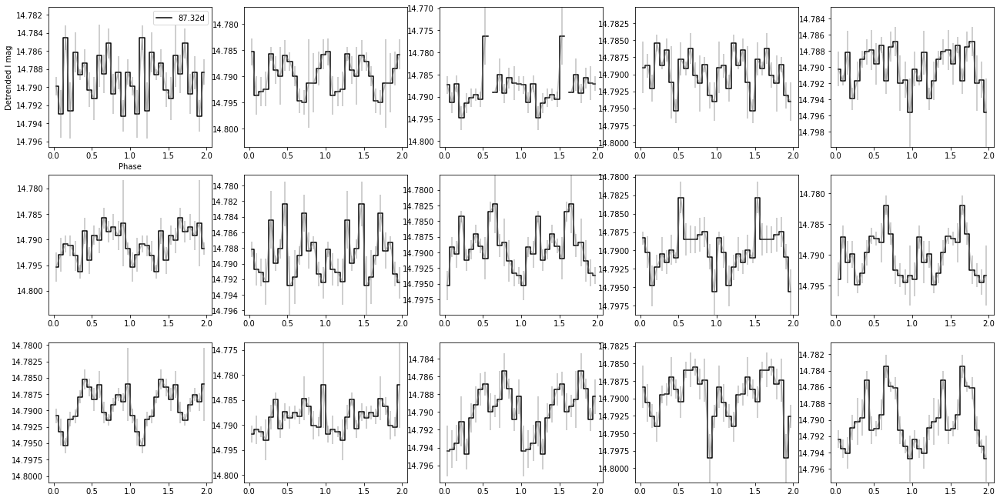

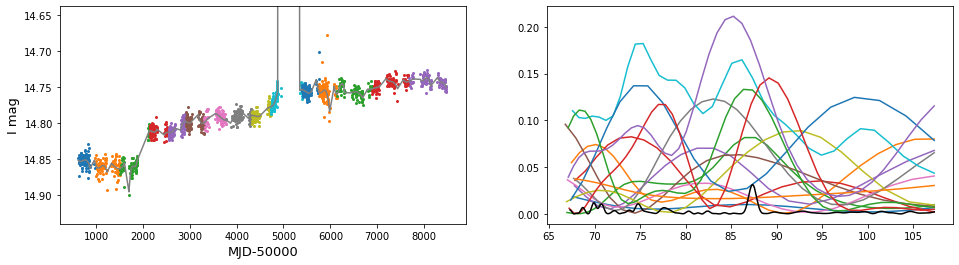

In [214]:
tab = orbchunks(38,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

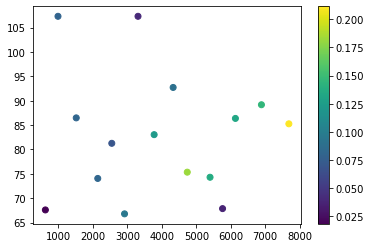

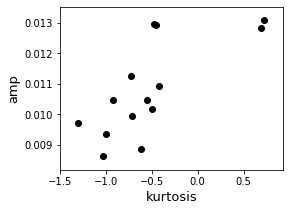

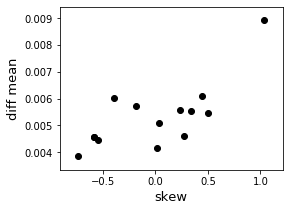

In [215]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

12 chunks use min points rather than time
established period: 71.98


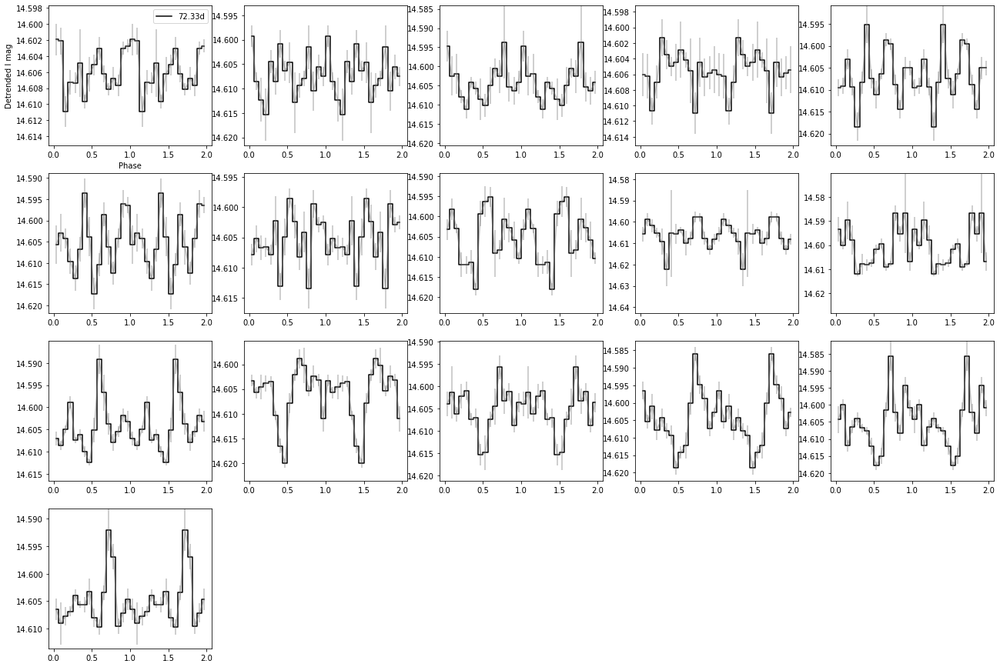

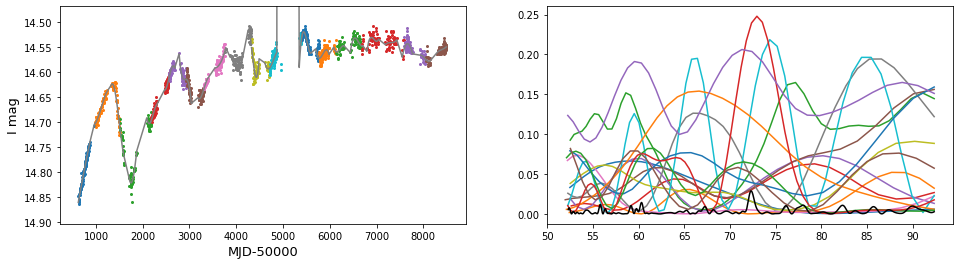

In [216]:
tab = orbchunks(39,0,num=365,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

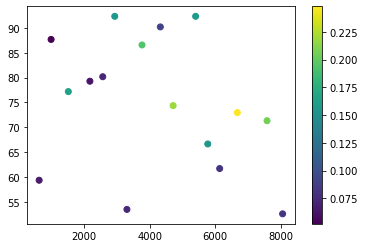

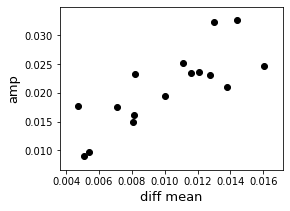

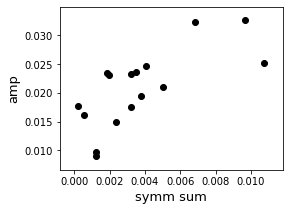

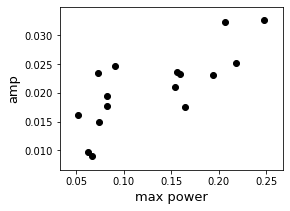

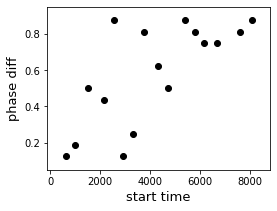

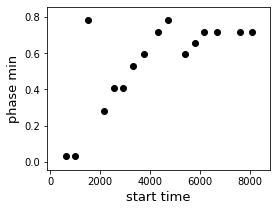

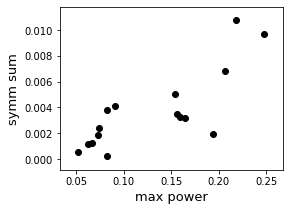

In [217]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)

2 chunks use min points rather than time
established period: 224.0


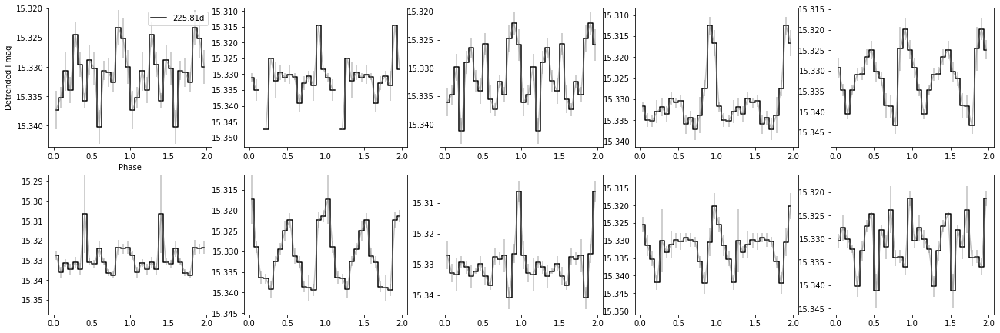

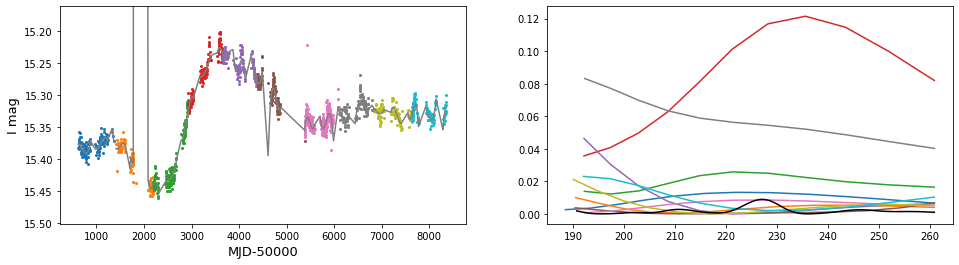

In [220]:
tab = orbchunks(40,0,num=365*2,time=True,minp=100,pbins=16,det=True,findpd=True,plotlc=True,save=False,file='',getstd=False,width=20)

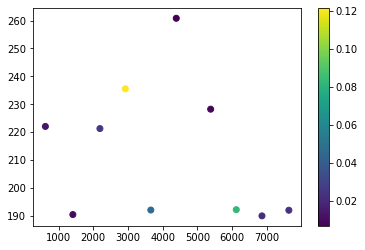

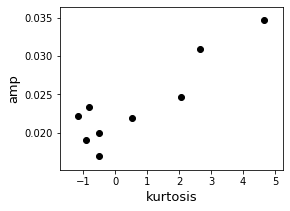

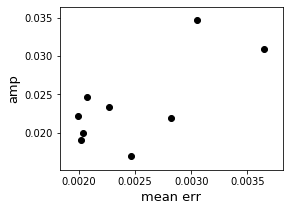

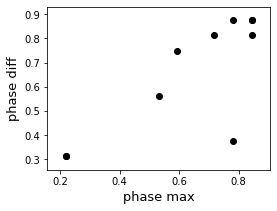

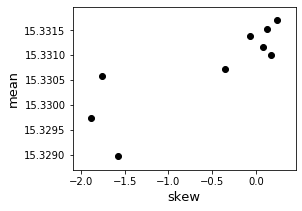

In [221]:
plt.scatter(tab['start time'],tab['best period'],c=tab['max power'])
plt.colorbar()
plotcorr(tab,minc=.7)